### Import Data
* use files path: **C:\Users\namb2\OneDrive\Documents\GitHub\BAIS3500_final_project_repo\data\final_data\white_wine_transformed.csv**
---

In [4]:
# import libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [5]:
# import csv files
white_wine_df=pd.read_csv(r'C:\Users\namb2\OneDrive\Documents\GitHub\BAIS3500_final_project_repo\data\final_data\white_wine_transformed.csv',sep=',',encoding='utf-8')

# display
white_wine_df.head()

,wine_ID,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,ph,sulphates,alcohol,quality,quality_transformed_3,quality_transformed_2
0,0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,medium quality,high quality
1,1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,medium quality,high quality
2,2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,medium quality,high quality
3,3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,medium quality,high quality
4,4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,medium quality,high quality


---
### EDA
---

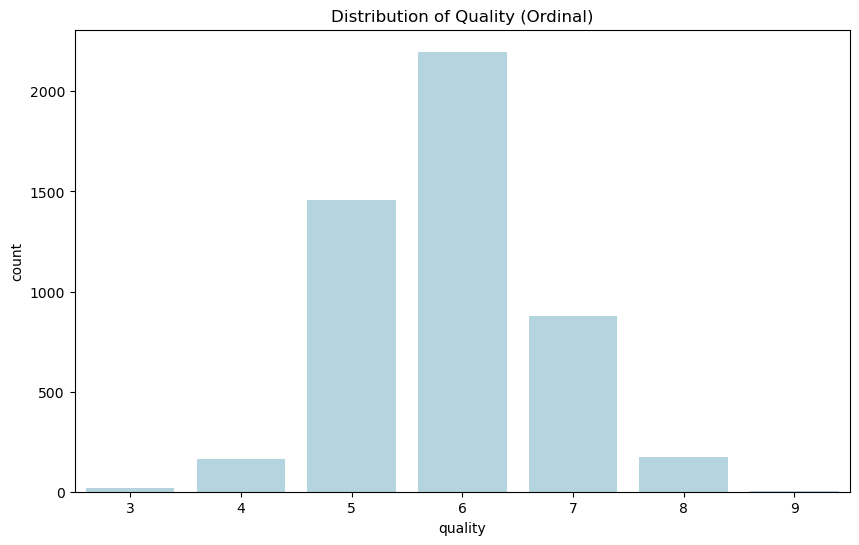

In [15]:
# target variable
plt.figure(figsize=(10,6))
sns.countplot(data=white_wine_df,x='quality',color='lightblue')
plt.title('Distribution of Quality (Ordinal)')
plt.show()

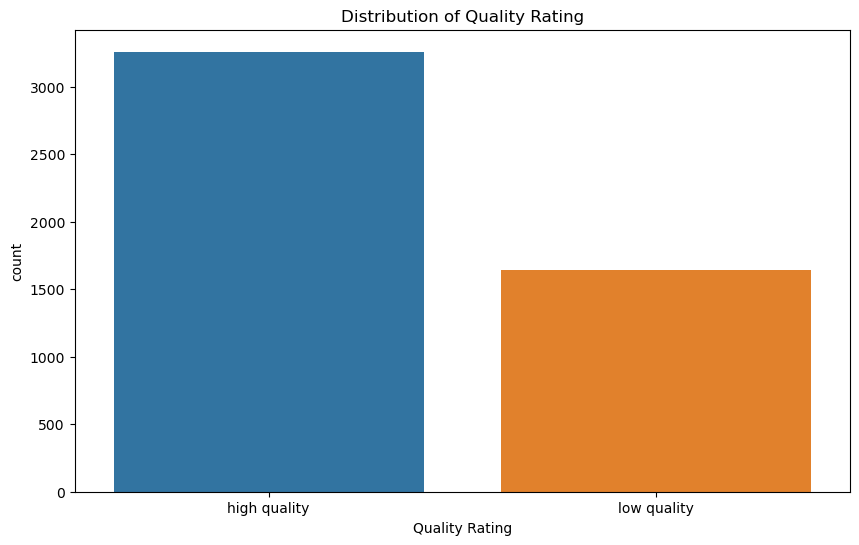

In [254]:
# target variable
plt.figure(figsize=(10,6))
sns.countplot(data=white_wine_df,x='quality_transformed',hue='quality_transformed_2')
plt.xlabel('Quality Rating')
plt.title('Distribution of Quality Rating')
plt.show()

In [74]:
white_wine_df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'ph', 'sulphates', 'alcohol', 'quality', 'quality_transformed_3',
       'quality_transformed_2'],
      dtype='object')

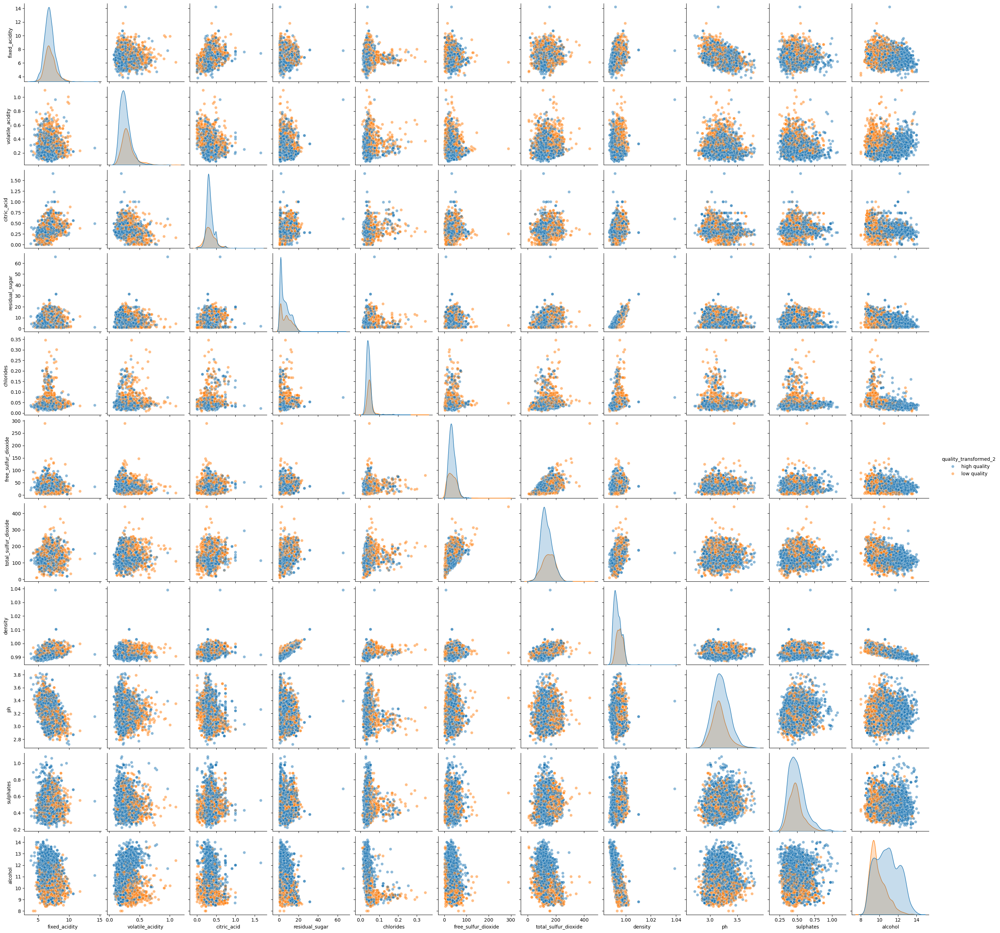

In [103]:
# pairplot
sns.pairplot(data=white_wine_df,vars=['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'ph', 'sulphates', 'alcohol'],hue='quality_transformed',plot_kws={'alpha': 0.5})
plt.show()

#### Quality feature is imbalanced

---
#### functions for plots

In [95]:
# function for distribution of quanitative features
def distribution(x,bins):
    fig,ax= plt.subplots(1,2,figsize=(14, 6),gridspec_kw={'width_ratios':[2,2]})
    sns.histplot(data=white_wine_df,x=x,color='lightblue',bins=bins,ax=ax[0])
    ax[0].set_xlabel('')
    sns.boxplot(data=white_wine_df,x=x,color='lightblue',ax=ax[1],orient='h')
    ax[1].set_xlabel('')
    plt.suptitle(f'Distribution of {x}')
    fig.text(0.5,0.04,x,ha='center',va='center')
    plt.show()

In [97]:
def boxplot(x,y): 
    plt.figure(figsize=(10, 6)) 
    sns.boxplot(data=white_wine_df,y=y,x=x) 
    plt.title(f'{y} by quality') 
    plt.xlabel('quality') 
    plt.ylabel(y) 
    plt.show()

In [113]:
# function for scatter plot by quality
def scatter(x,y,tar):
    if tar=='quality':
        palette={
            1: '#ff0000',  # Red
            2: '#ff7f00',  # Orange
            3: '#ffff00',  # Yellow
            4: '#7fff00',  # Chartreuse Green
            5: '#00ff00',  # Green
            6: '#00ffff',  # Cyan
            7: '#007fff',  # Azure
            8: '#0000ff',  # Blue
            9: '#7f00ff',  # Violet
            10: '#ff00ff'  # Magenta
        }
    else:
        palette=None
        
    plt.figure(figsize=(6,6))
    sns.scatterplot(data=white_wine_df,x=x,y=y,hue=tar,palette=palette,alpha=0.4)
    plt.title(f'{x} vs. {y} by Quality')
    plt.show()

**fixed acidity and alcohol**

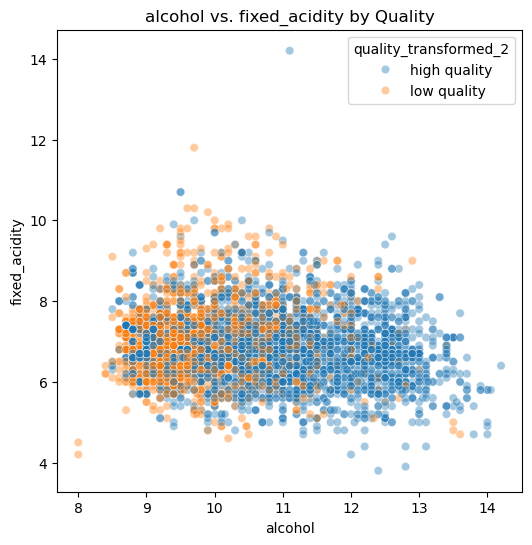

In [116]:
by='quality_transformed'

scatter('alcohol','fixed_acidity',by)

**chlorides and alcohol**

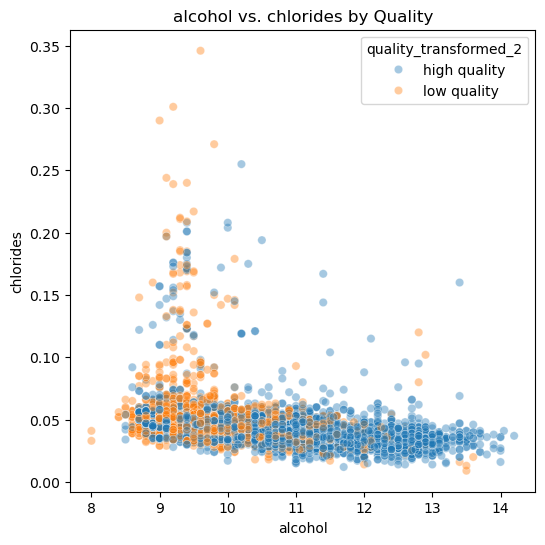

In [119]:
scatter('alcohol','chlorides',by)

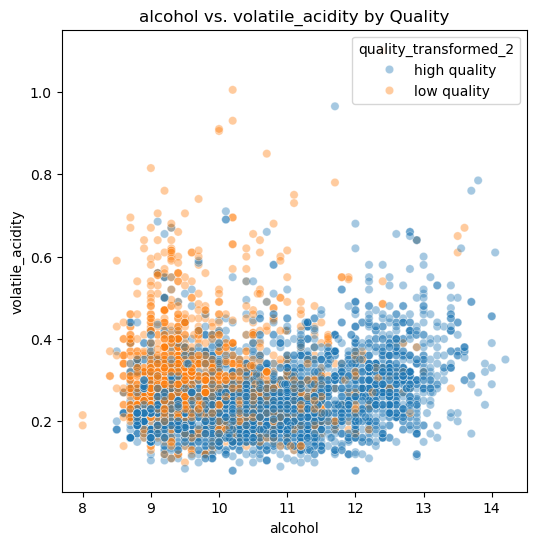

In [125]:
x='alcohol'

scatter(x,'volatile_acidity',by)

**residual sugar and density**

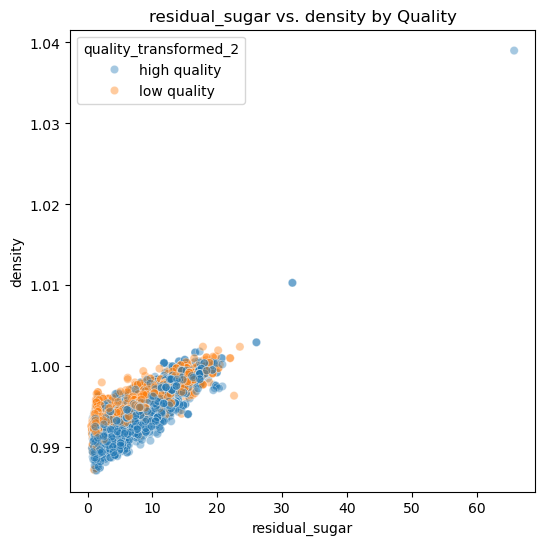

In [128]:
scatter('residual_sugar','density',by)

In [133]:
white_wine_df.columns

Index(['wine_ID', 'fixed_acidity', 'volatile_acidity', 'citric_acid',
       'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
       'total_sulfur_dioxide', 'density', 'ph', 'sulphates', 'alcohol',
       'quality', 'quality_transformed_3', 'quality_transformed_2'],
      dtype='object')

**correlation**

In [137]:
correlation_df=white_wine_df[['fixed_acidity', 'volatile_acidity', 'citric_acid',
       'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
       'total_sulfur_dioxide', 'density', 'ph', 'sulphates', 'alcohol']].corr()

In [141]:
correlation_df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,ph,sulphates,alcohol
fixed_acidity,1.000000,-0.022697,0.289181,0.089021,0.023086,-0.049396,0.091070,0.265331,-0.425858,-0.017143,-0.120881
volatile_acidity,-0.022697,1.000000,-0.149472,0.064286,0.070512,-0.097012,0.089261,0.027114,-0.031915,-0.035728,0.067718
citric_acid,0.289181,-0.149472,1.000000,0.094212,0.114364,0.094077,0.121131,0.149503,-0.163748,0.062331,-0.075729
residual_sugar,0.089021,0.064286,0.094212,1.000000,0.088685,0.299098,0.401439,0.838966,-0.194133,-0.026664,-0.450631
chlorides,0.023086,0.070512,0.114364,0.088685,1.000000,0.101392,0.198910,0.257211,-0.090439,0.016763,-0.360189
free_sulfur_dioxide,-0.049396,-0.097012,0.094077,0.299098,0.101392,1.000000,0.615501,0.294210,-0.000618,0.059217,-0.250104
total_sulfur_dioxide,0.091070,0.089261,0.121131,0.401439,0.198910,0.615501,1.000000,0.529881,0.002321,0.134562,-0.448892
density,0.265331,0.027114,0.149503,0.838966,0.257211,0.294210,0.529881,1.000000,-0.093591,0.074493,-0.780138
ph,-0.425858,-0.031915,-0.163748,-0.194133,-0.090439,-0.000618,0.002321,-0.093591,1.000000,0.155951,0.121432
sulphates,-0.017143,-0.035728,0.062331,-0.026664,0.016763,0.059217,0.134562,0.074493,0.155951,1.000000,-0.017433


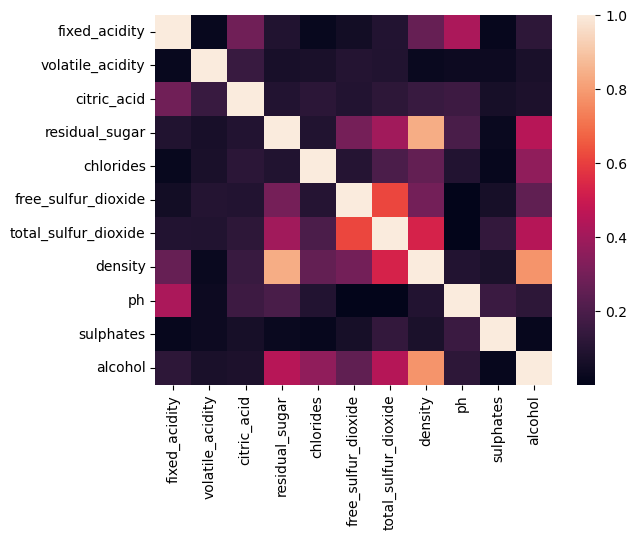

In [145]:
sns.heatmap(abs(correlation_df))

plt.show()

**items with correlation**

- density and alcohol
- total sulfur dioxide and free sulfur dioxide
- density and total sulfur dioxide

In [430]:
def outliers(x):
    
    values=white_wine_df[x]
    
    q1, q3 = np.percentile(values, [25, 75])
    iqr = q3 - q1
    lower = q1 - (1.5 * iqr)
    upper = q3 + (1.5 * iqr)

    return lower,upper


def mask(lower,upper,x):
    # create filters that remove all rows that fall outside of these limits
    lower_mask = (white_wine_df[x] > lower)
    upper_mask = (white_wine_df[x] < upper)

    return  white_wine_df[lower_mask & upper_mask]


def boxplot_normal(x):
    sns.boxplot(data=cleaned_data,x=x,y='quality_transformed',hue='quality_transformed')
    plt.ylabel('')
    plt.show()

def scatter_normal(x,y,x_label,y_label):

    # normalize x values
    x_values=white_wine_df[x]
    
    q1_x, q3_x = np.percentile(x_values, [25, 75])
    iqr_x = q3_x - q1_x
    lower_x = q1_x - (1.5 * iqr_x)
    upper_x = q3_x + (1.5 * iqr_x)

    q1_x, q3_x = np.percentile(x_values, [25, 75])

    # normalize y
    y_values=white_wine_df[y]
    
    q1_y, q3_y = np.percentile(y_values, [25, 75])
    iqr_y = q3_y - q1_y
    lower_y = q1_y - (1.5 * iqr_y)
    upper_y = q3_y + (1.5 * iqr_y)

    q1_y, q3_y = np.percentile(y_values, [25, 75])
    

    # mask for x
    lower_mask_x = (white_wine_df[x] > lower_x)
    upper_mask_x = (white_wine_df[x] < upper_x)
    
    # mask for y
    lower_mask_y = (white_wine_df[y] > lower_y)
    upper_mask_y = (white_wine_df[y] < upper_y)

    cleaned_df=white_wine_df[lower_mask_x & upper_mask_x & lower_mask_y & upper_mask_y]

    plt.figure(figsize=(6,6))
    scatter=sns.scatterplot(data=cleaned_df,x=x,y=y,hue='quality_transformed',alpha=0.4)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    legend=scatter.legend_
    legend.set_title('Quality Rating')
    plt.title(f'{x_label} vs. {y_label} by Quality Rating')
    plt.show()

    plt.figure(figsize=(6,6))
    kdeplot=sns.kdeplot(data=cleaned_df,x=x,y=y,hue='quality_transformed',fill=True,alpha=0.4)
    legend=kdeplot.legend_
    legend.set_title('Quality Rating')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(f'{x_label} vs. {y_label} by Quality Rating')
    plt.show()

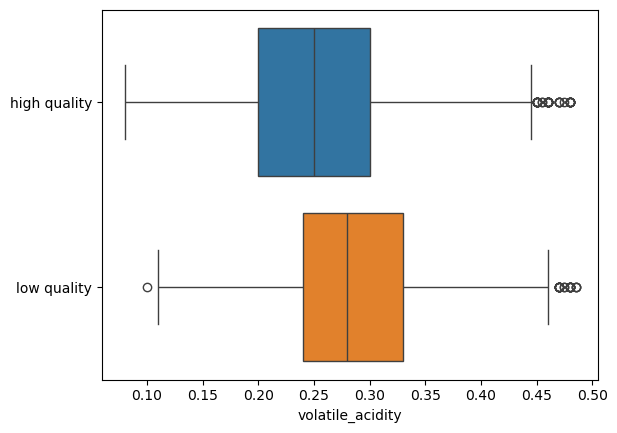

In [212]:
lower,upper=outliers('volatile_acidity')

cleaned_data=mask(lower,upper,'volatile_acidity')

boxplot_normal('volatile_acidity')

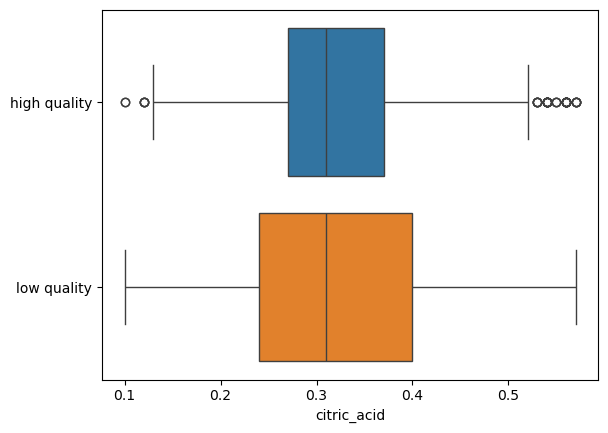

In [178]:
value='citric_acid'

lower,upper=outliers(value)

cleaned_data=mask(lower,upper,value)

boxplot_normal(value)

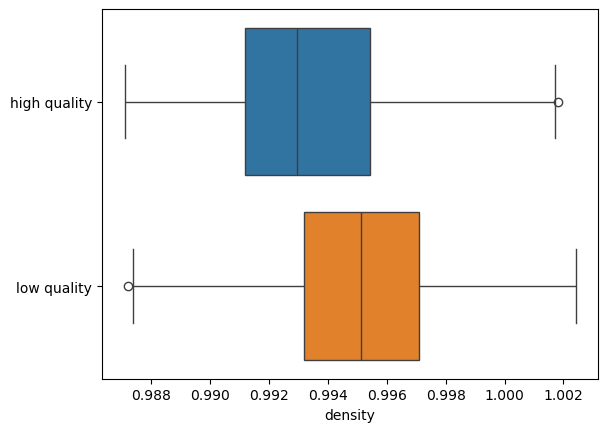

In [180]:
value='density'

lower,upper=outliers(value)

cleaned_data=mask(lower,upper,value)

boxplot_normal(value)

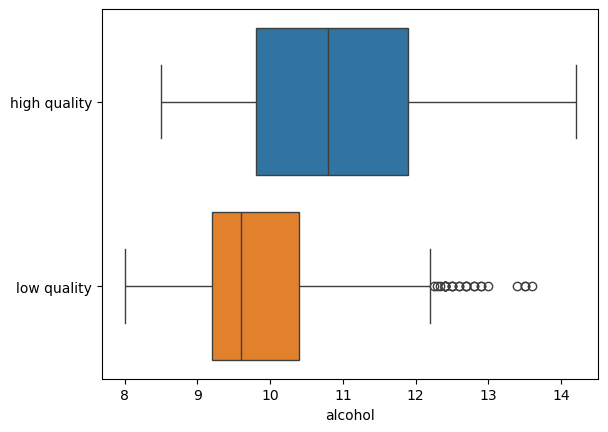

In [182]:
value='alcohol'

lower,upper=outliers(value)

cleaned_data=mask(lower,upper,value)

boxplot_normal(value)

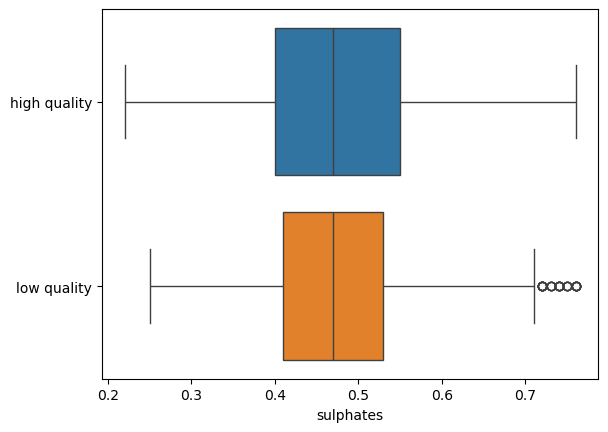

In [184]:
value='sulphates'

lower,upper=outliers(value)

cleaned_data=mask(lower,upper,value)

boxplot_normal(value)

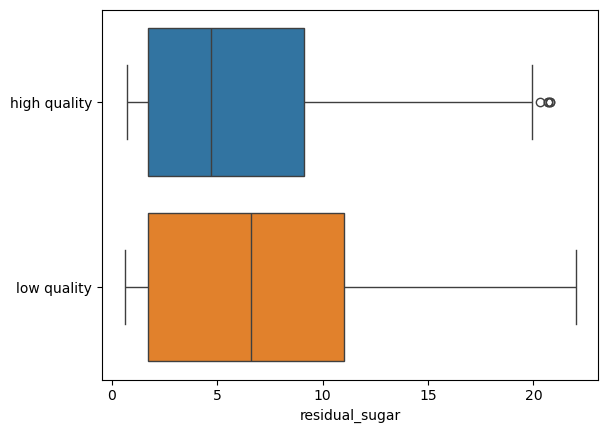

In [186]:
value='residual_sugar'

lower,upper=outliers(value)

cleaned_data=mask(lower,upper,value)

boxplot_normal(value)

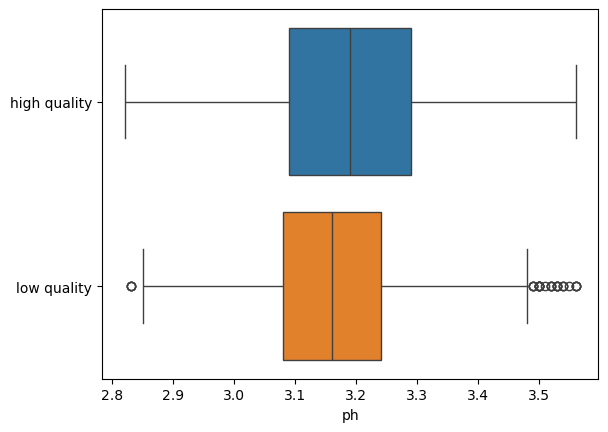

In [188]:
value='ph'

lower,upper=outliers(value)

cleaned_data=mask(lower,upper,value)

boxplot_normal(value)

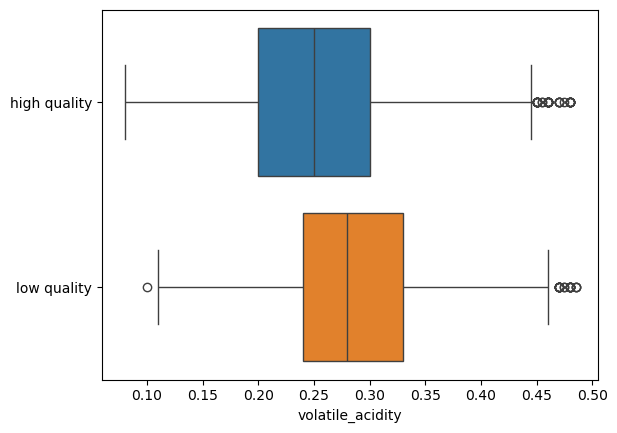

In [190]:
value='volatile_acidity'

lower,upper=outliers(value)

cleaned_data=mask(lower,upper,value)

boxplot_normal(value)

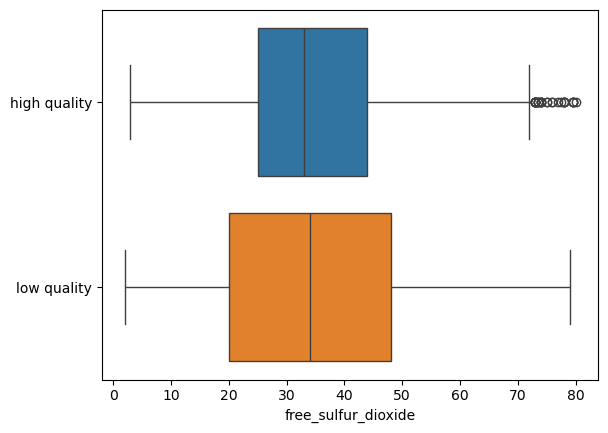

In [192]:
value='free_sulfur_dioxide'

lower,upper=outliers(value)

cleaned_data=mask(lower,upper,value)

boxplot_normal(value)

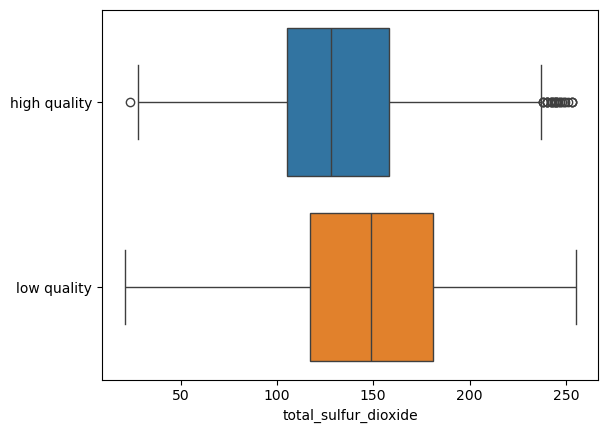

In [194]:
value='total_sulfur_dioxide'

lower,upper=outliers(value)

cleaned_data=mask(lower,upper,value)

boxplot_normal(value)

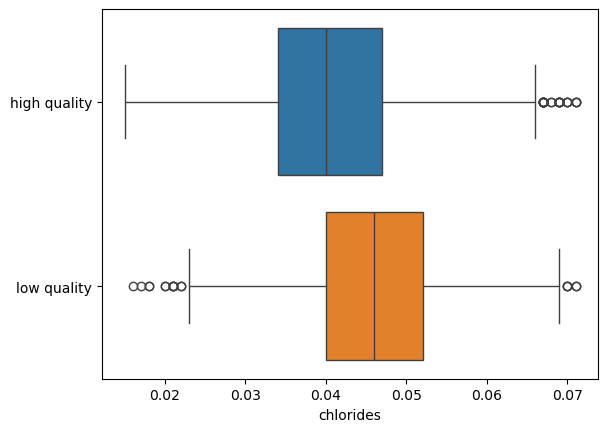

In [196]:
value='chlorides'

lower,upper=outliers(value)

cleaned_data=mask(lower,upper,value)

boxplot_normal(value)

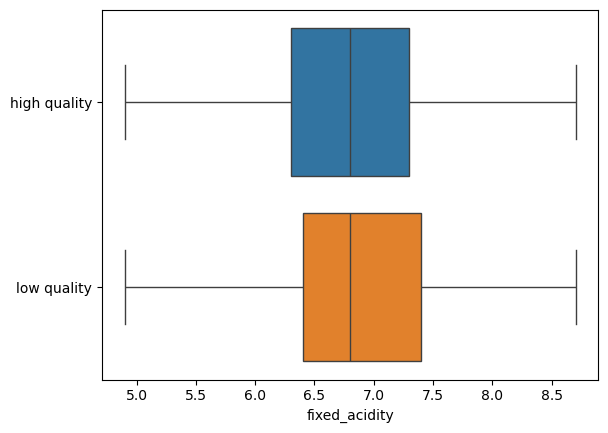

In [198]:
value='fixed_acidity'

lower,upper=outliers(value)

cleaned_data=mask(lower,upper,value)

boxplot_normal(value)

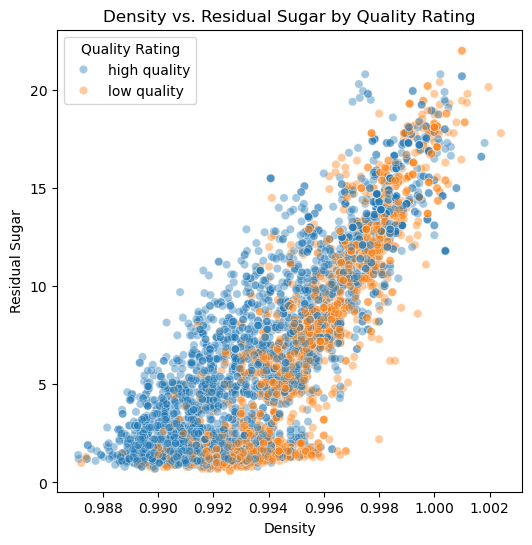

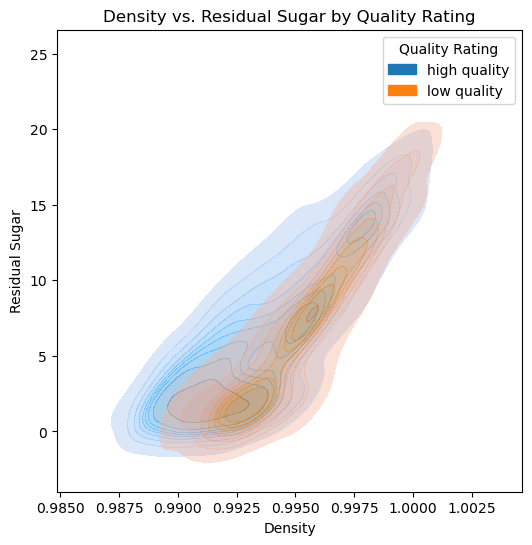

In [433]:
# scatter
scatter_normal('density','residual_sugar','Density','Residual Sugar')

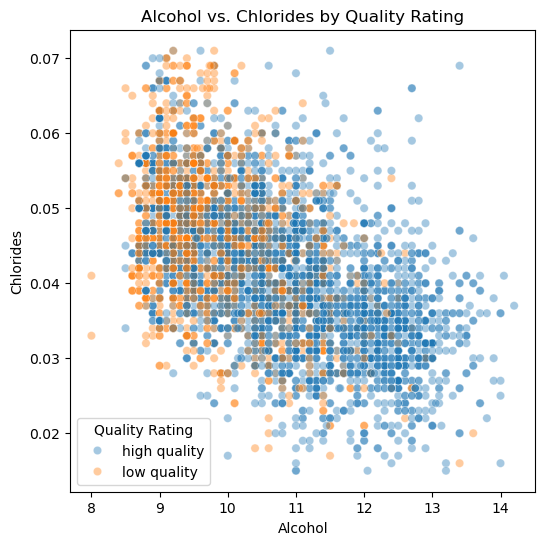

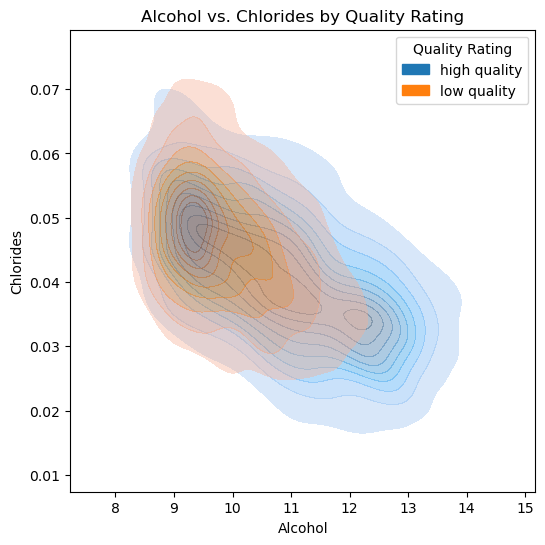

In [435]:
scatter_normal('alcohol','chlorides','Alcohol','Chlorides')

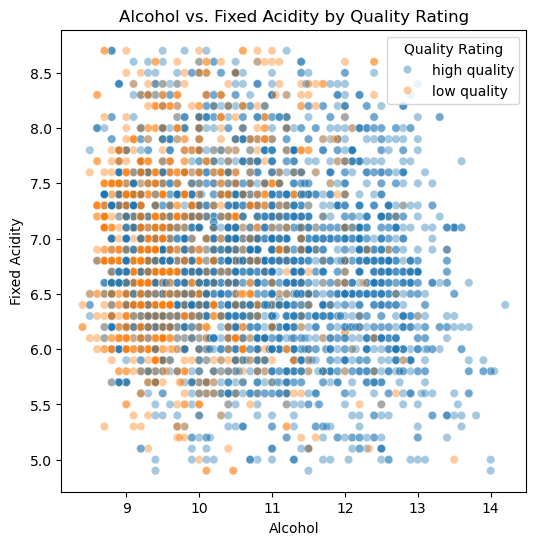

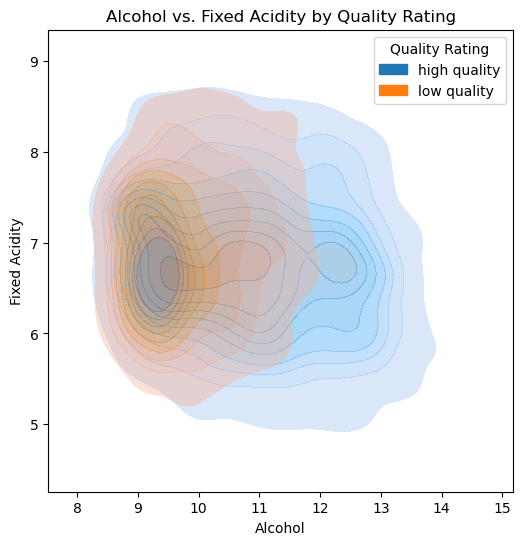

In [436]:
scatter_normal('alcohol','fixed_acidity','Alcohol','Fixed Acidity')

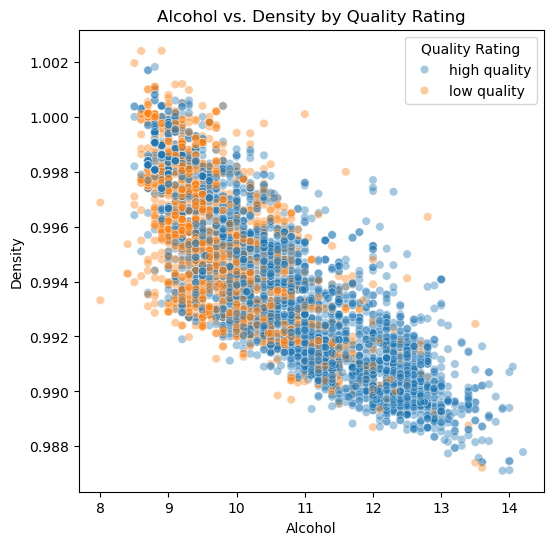

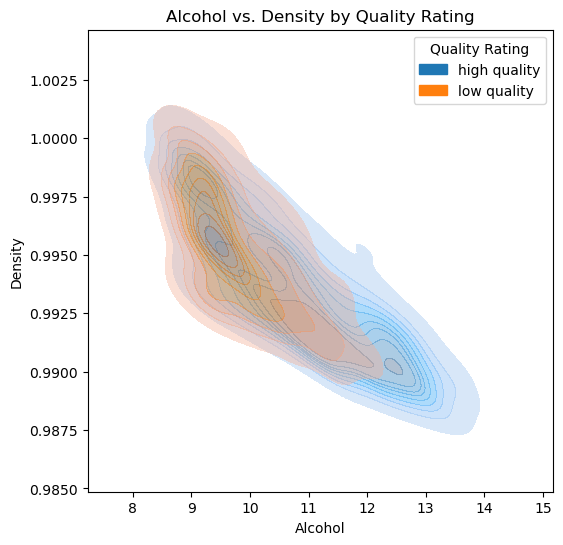

In [437]:
scatter_normal('alcohol','density','Alcohol','Density')

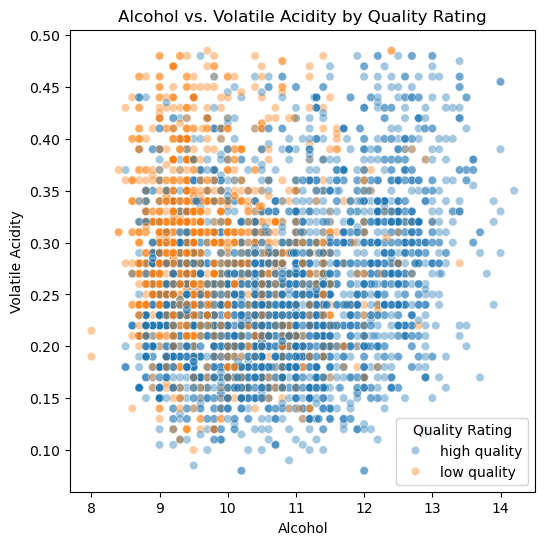

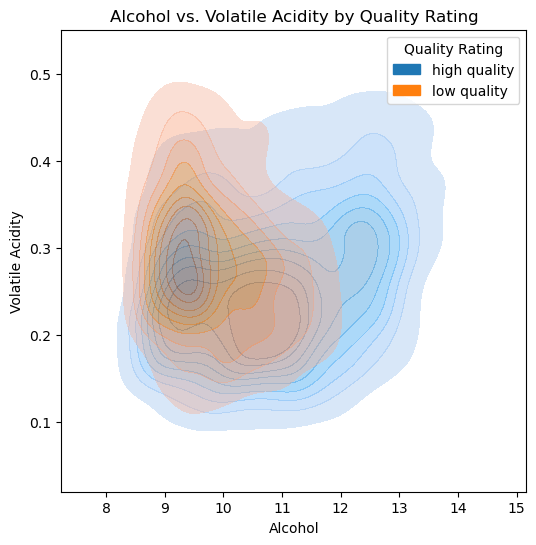

In [438]:
scatter_normal('alcohol','volatile_acidity','Alcohol','Volatile Acidity')

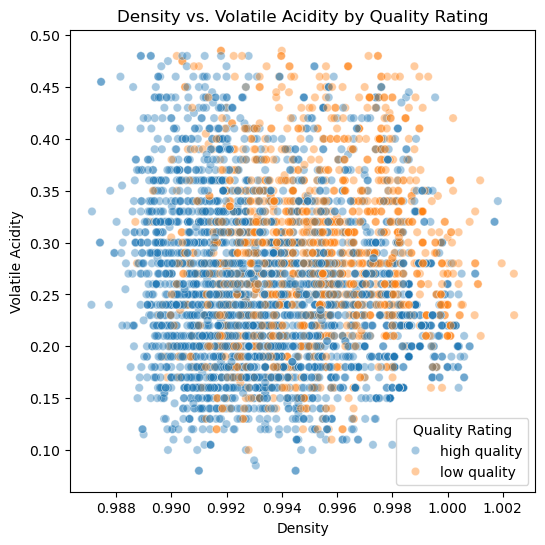

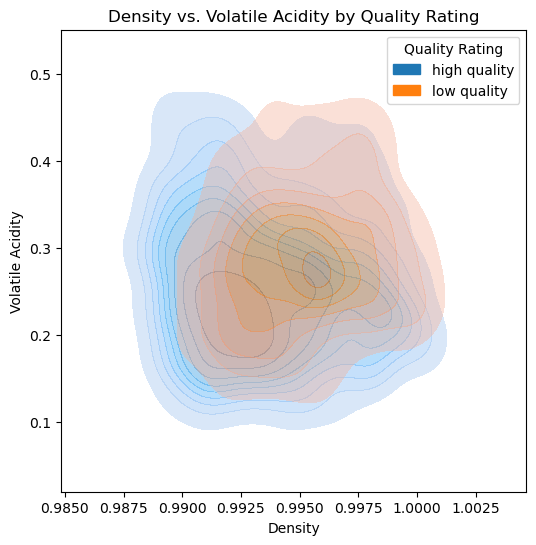

In [439]:
scatter_normal('density','volatile_acidity','Density','Volatile Acidity')

In [368]:
# target variable
def histplot(x,x_label,n):
    plt.figure(figsize=(6,6))
    histplot=sns.histplot(data=white_wine_df,x=x,multiple='dodge',hue='quality_transformed',bins=n)
    legend=histplot.legend_
    legend.set_title('Quality Rating')
    plt.xlabel(x_label)
    plt.title(f'{x_label} Distribution by Quality Rating')
    plt.show()

def kdeplot(x,x_label):
    plt.figure(figsize=(6,6))
    kdeplot=sns.kdeplot(data=white_wine_df,x=x,hue='quality_transformed',fill=True,alpha=0.5)
    legend=kdeplot.legend_
    legend.set_title('Quality Rating')
    plt.xlabel(x_label)
    plt.title(f'{x_label} Distribution by Quality Rating')
    plt.show()

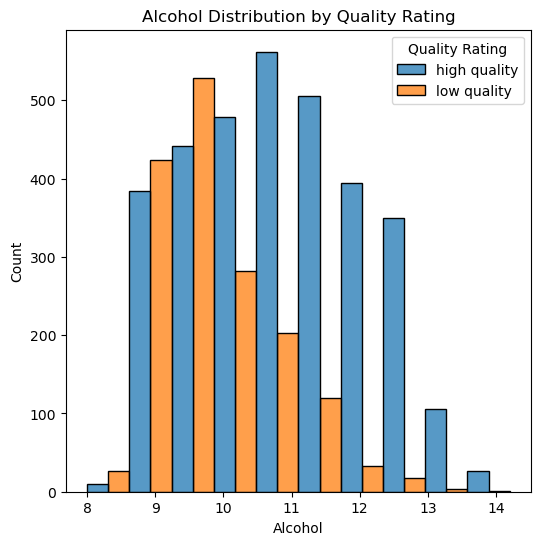

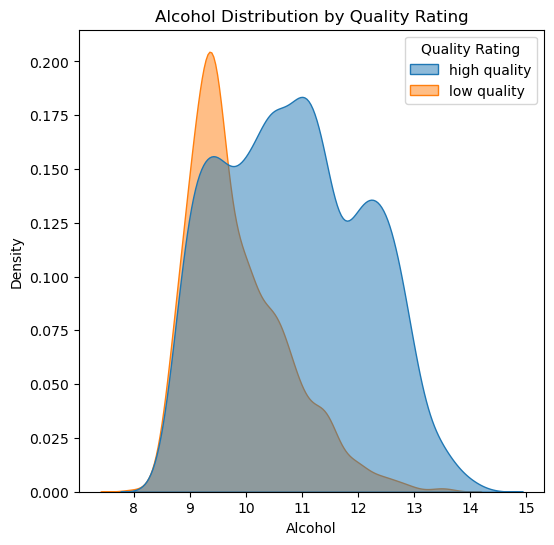

In [370]:
histplot('alcohol','Alcohol',10)
kdeplot('alcohol','Alcohol')

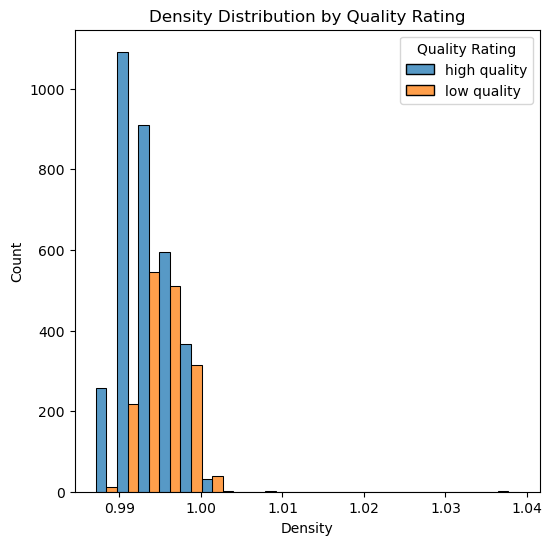

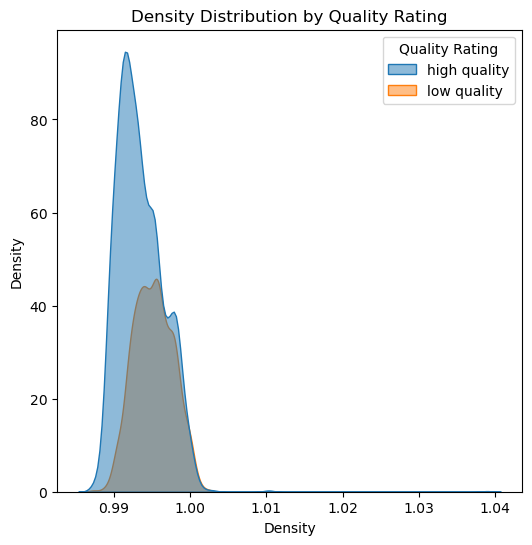

In [372]:
histplot('density','Density',20)
kdeplot('density','Density')

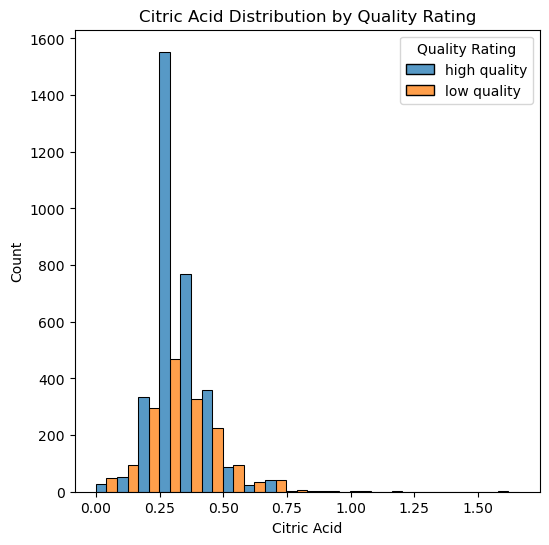

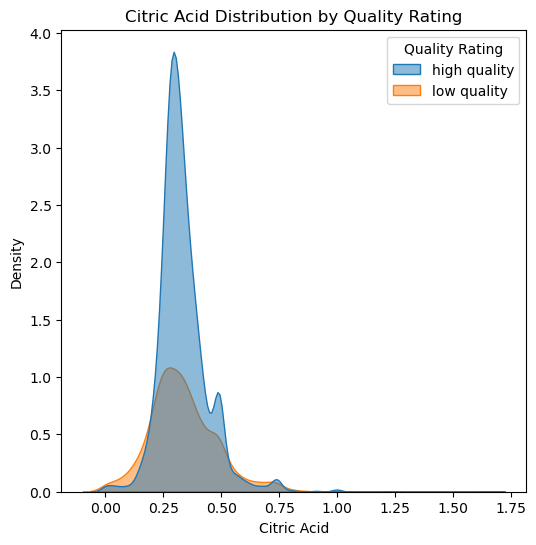

In [374]:
histplot('citric_acid','Citric Acid',20)
kdeplot('citric_acid','Citric Acid')

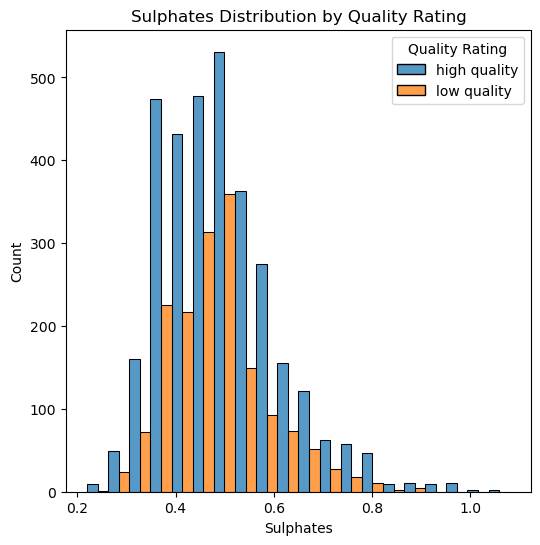

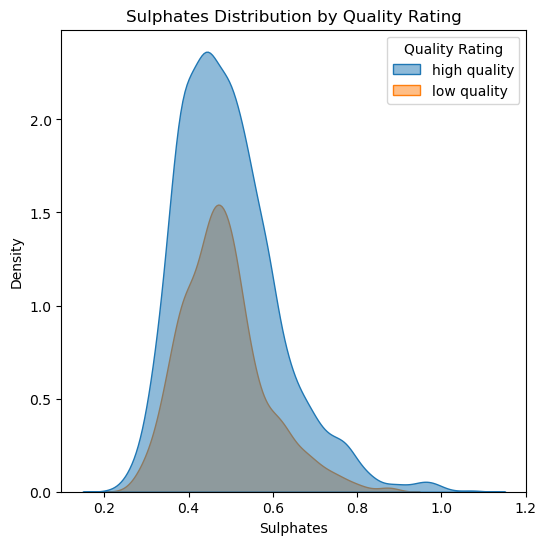

In [376]:
histplot('sulphates','Sulphates',20)
kdeplot('sulphates','Sulphates')

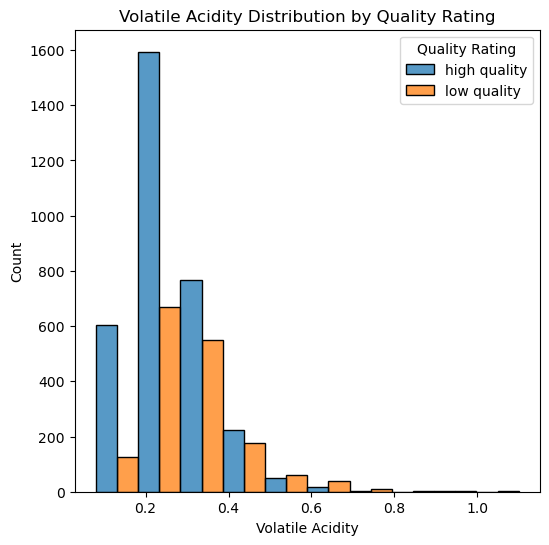

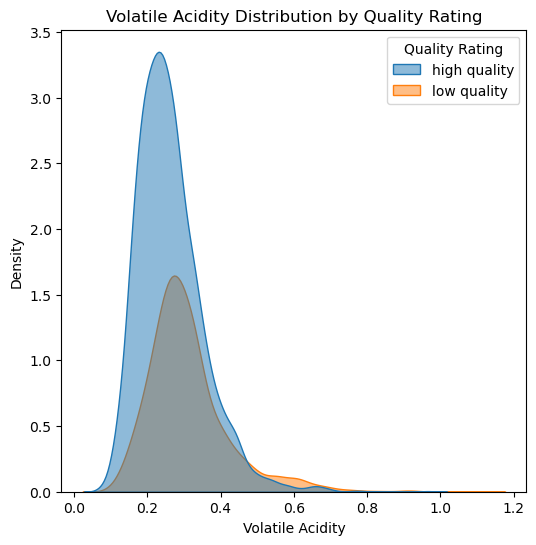

In [380]:
histplot('volatile_acidity','Volatile Acidity',10)
kdeplot('volatile_acidity','Volatile Acidity')

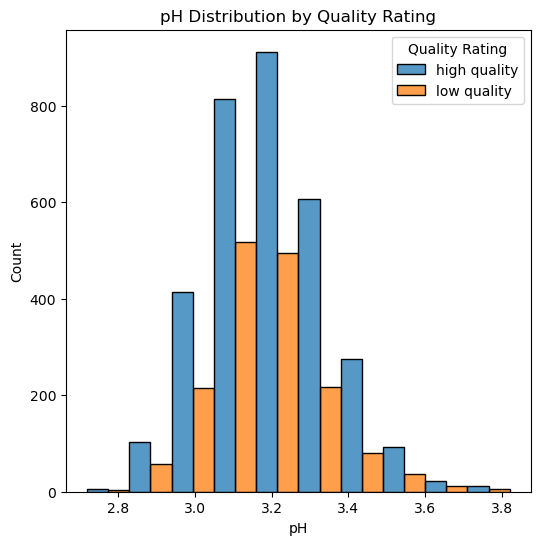

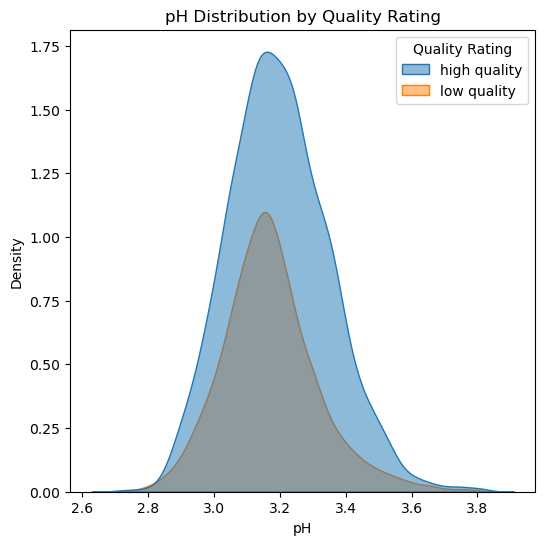

In [382]:
histplot('ph','pH',10)
kdeplot('ph','pH')

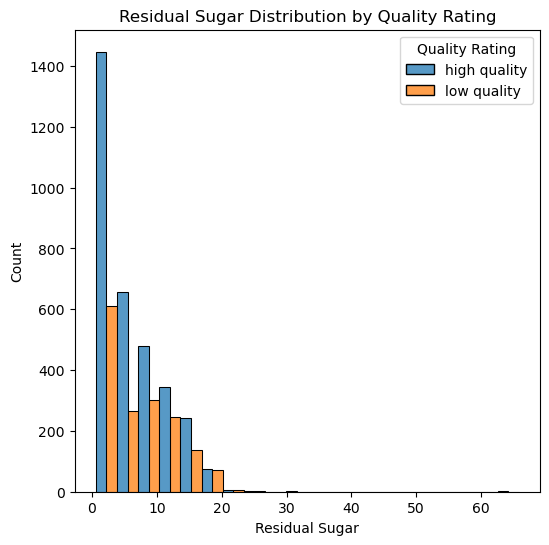

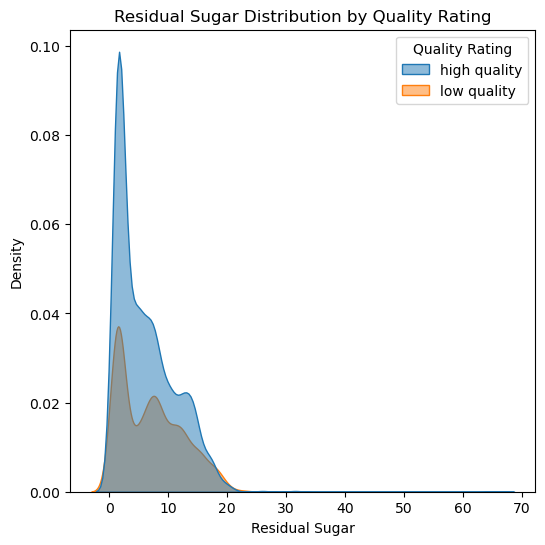

In [384]:
histplot('residual_sugar','Residual Sugar',20)
kdeplot('residual_sugar','Residual Sugar')

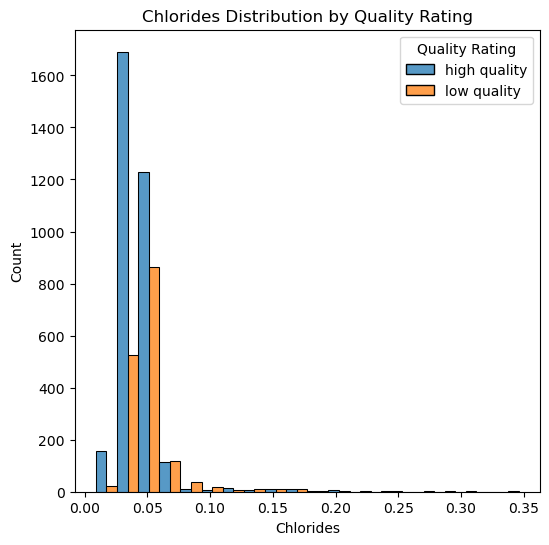

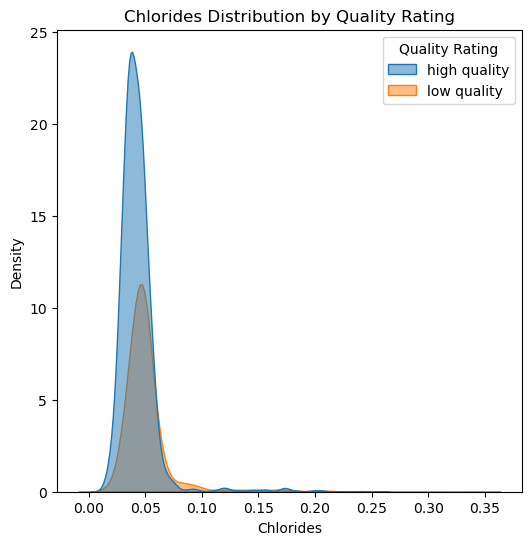

In [386]:
histplot('chlorides','Chlorides',20)
kdeplot('chlorides','Chlorides')

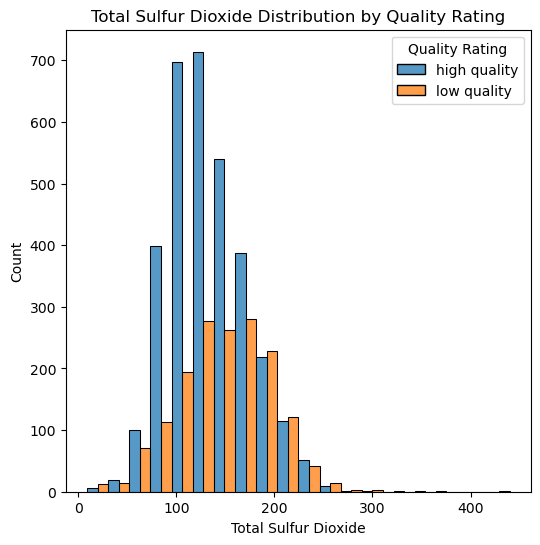

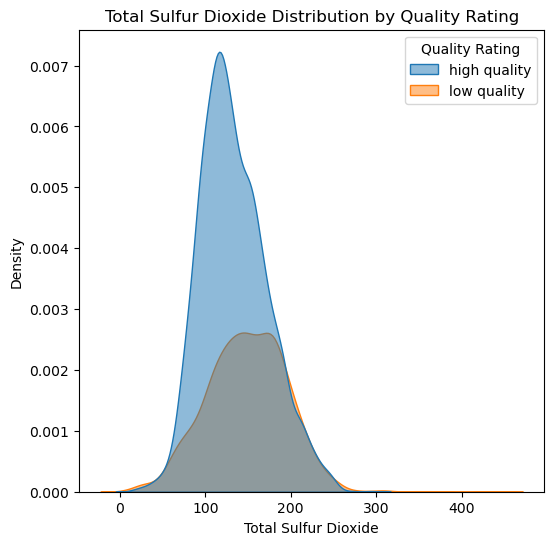

In [388]:
histplot('total_sulfur_dioxide','Total Sulfur Dioxide',20)
kdeplot('total_sulfur_dioxide','Total Sulfur Dioxide')

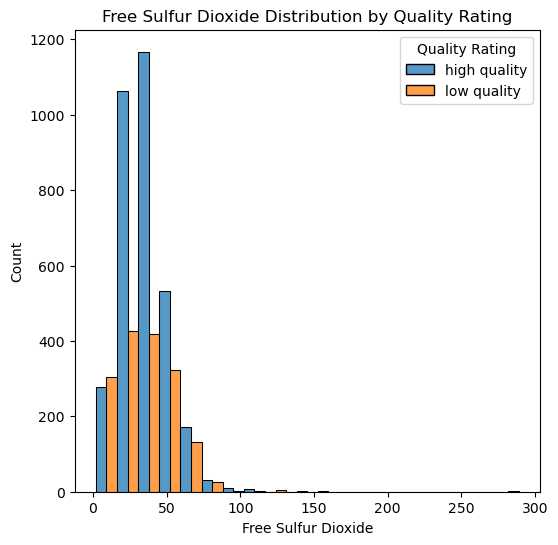

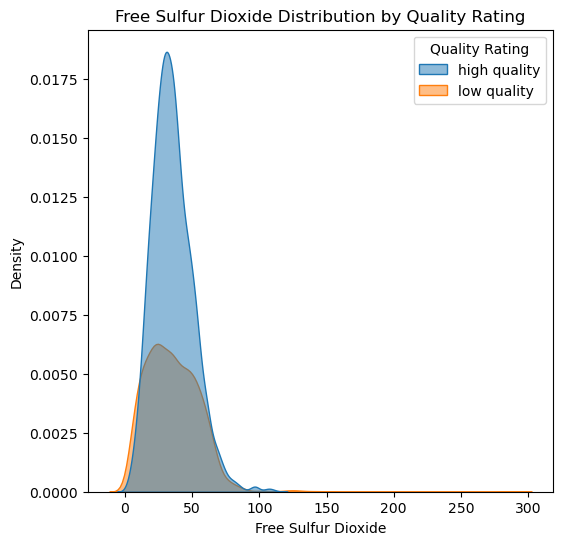

In [390]:
histplot('free_sulfur_dioxide','Free Sulfur Dioxide',20)
kdeplot('free_sulfur_dioxide','Free Sulfur Dioxide')

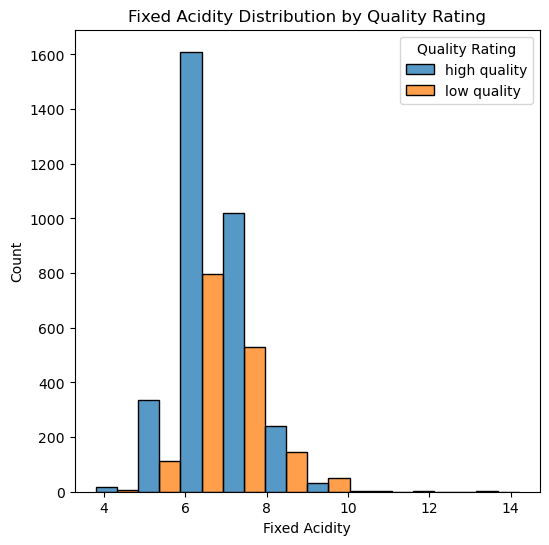

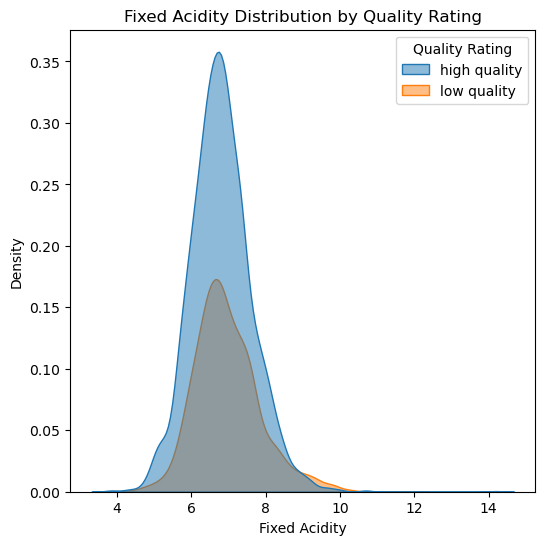

In [392]:
histplot('fixed_acidity','Fixed Acidity',10)
kdeplot('fixed_acidity','Fixed Acidity')

---
#### Fixed Acidity Feature

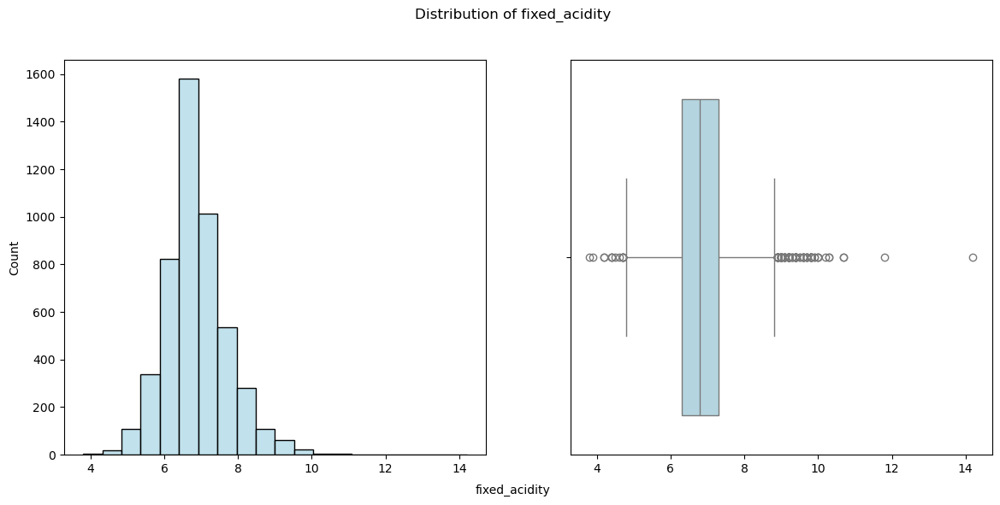

In [56]:
distribution('fixed_acidity',20)

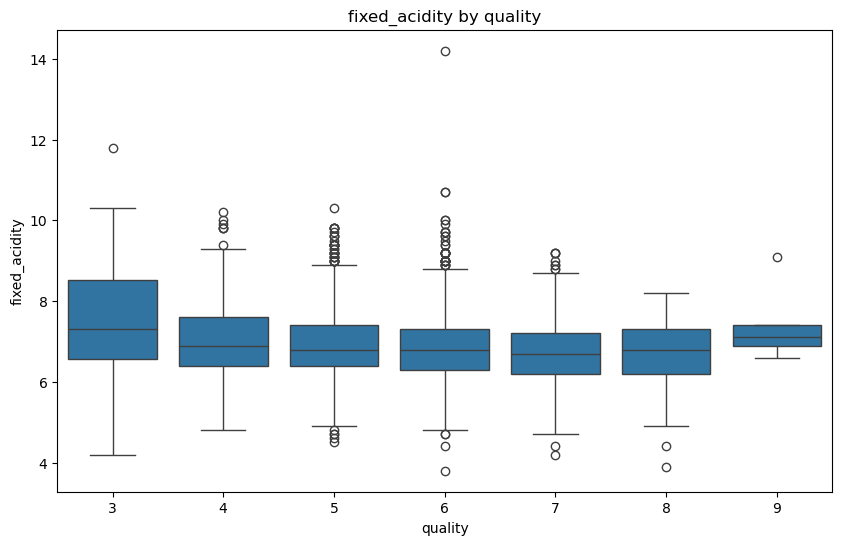

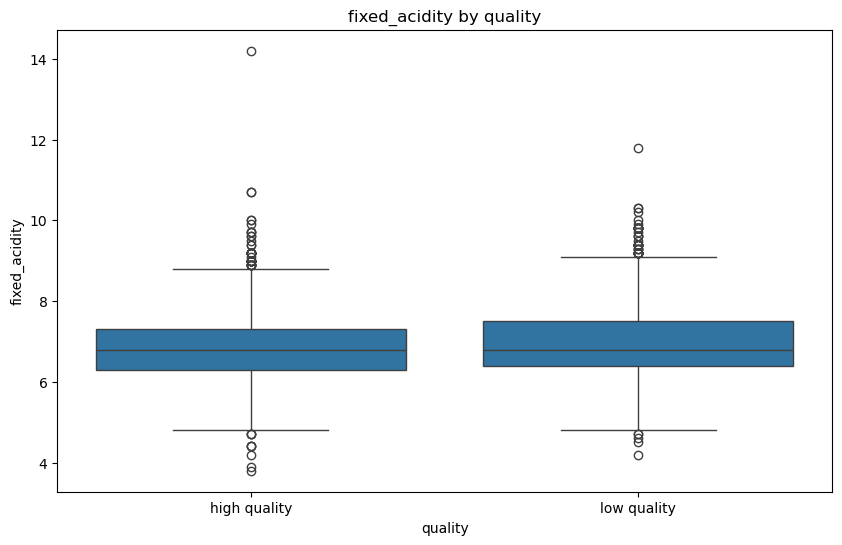

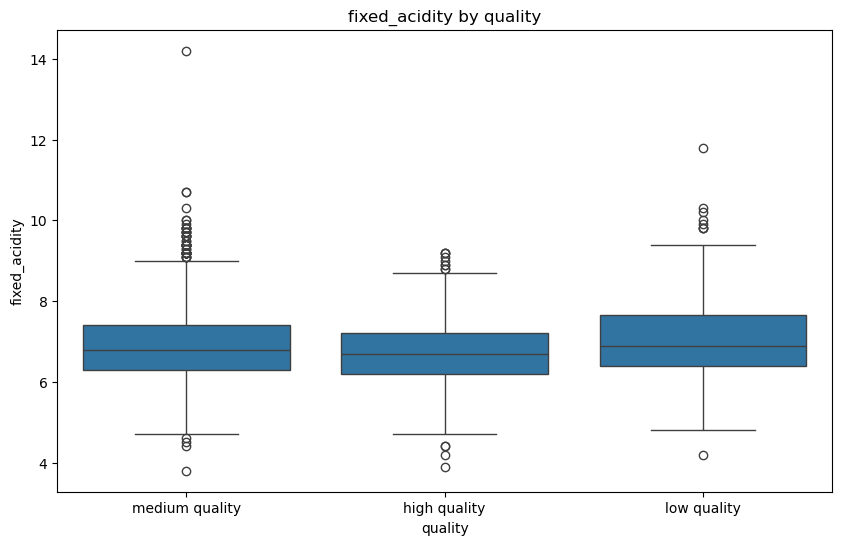

In [57]:
boxplot('quality','fixed_acidity')
boxplot('quality_transformed','fixed_acidity')

#### fixed_acidity is unimodal with sligh right skew

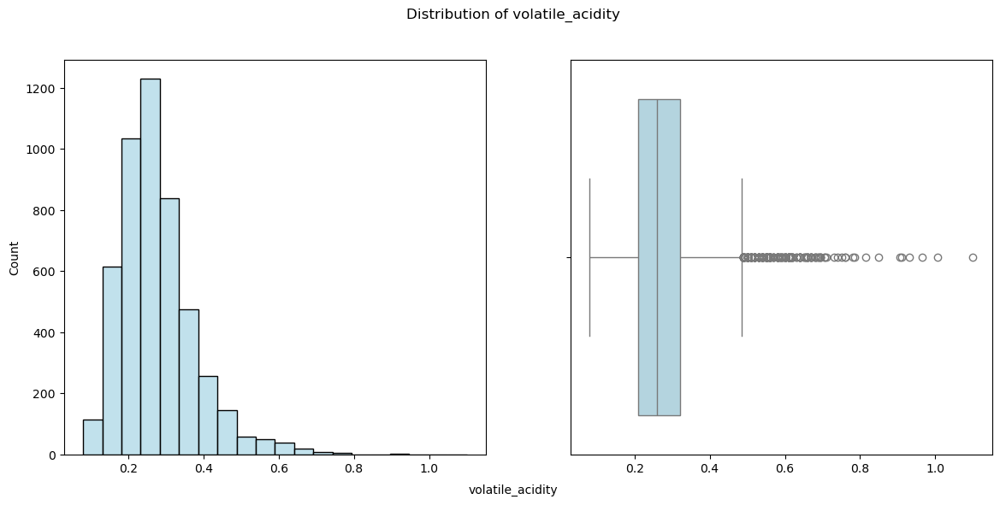

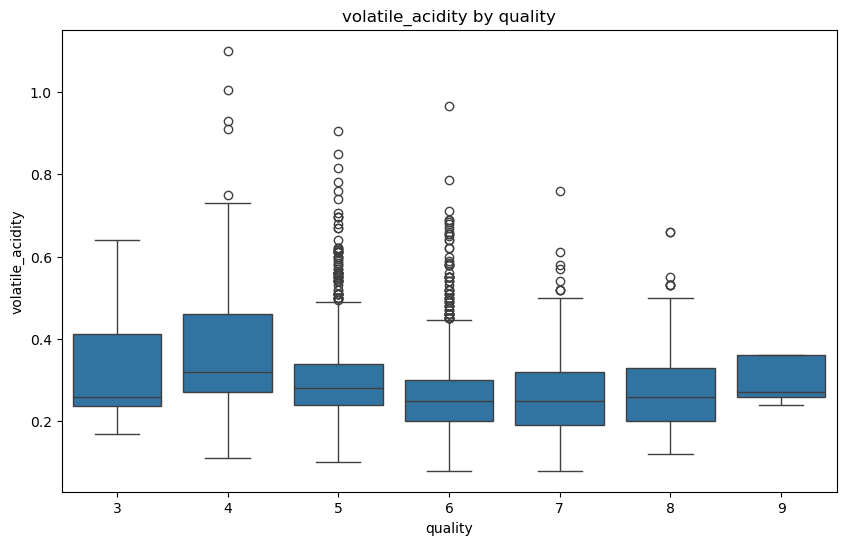

In [21]:
distribution('volatile_acidity',20)
boxplot('volatile_acidity')

#### volatile_acidity is somewhat unimodal with right skew

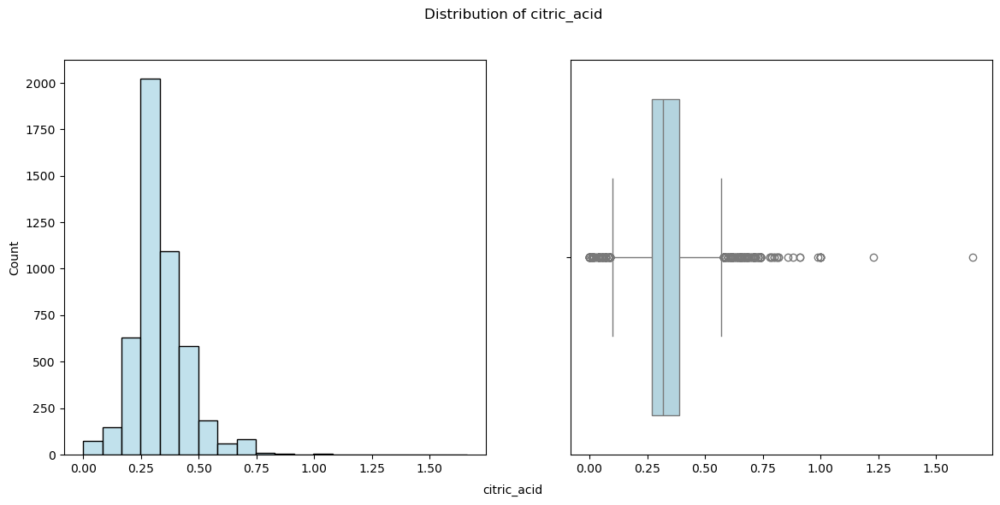

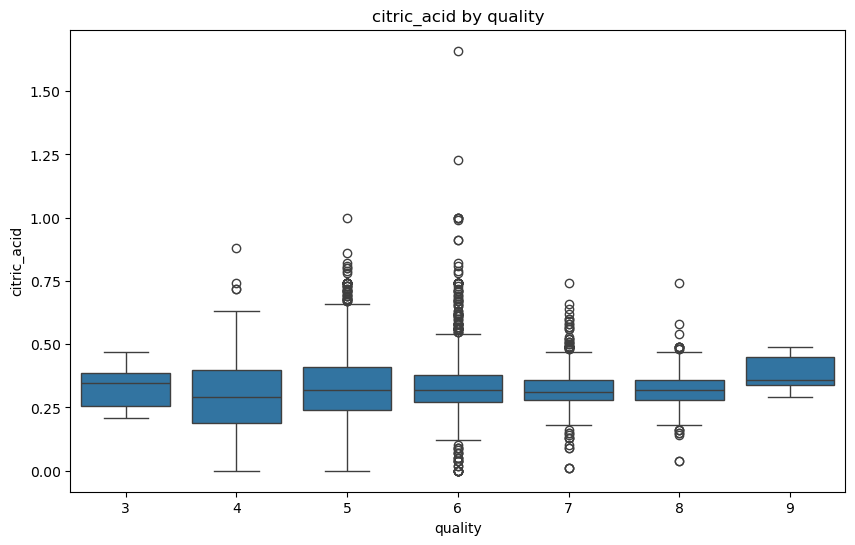

In [23]:
distribution('citric_acid',20)
boxplot('citric_acid')

#### citric_acid is somewhat unimodal with right skew

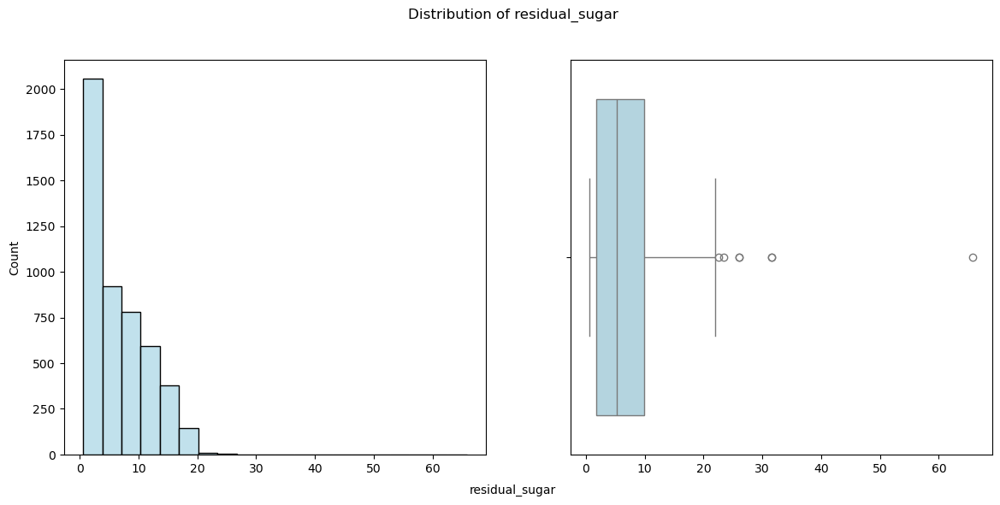

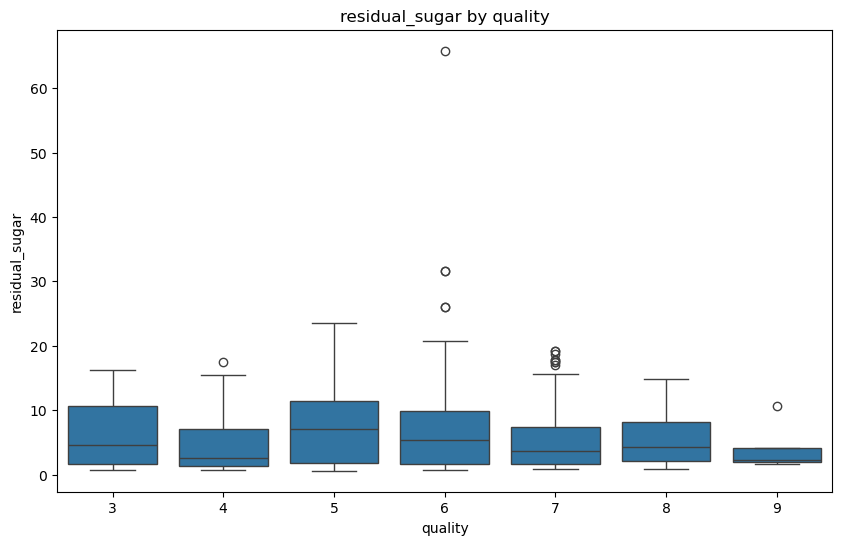

In [25]:
distribution('residual_sugar',20)
boxplot('residual_sugar')

#### residual_sugar is right skewed

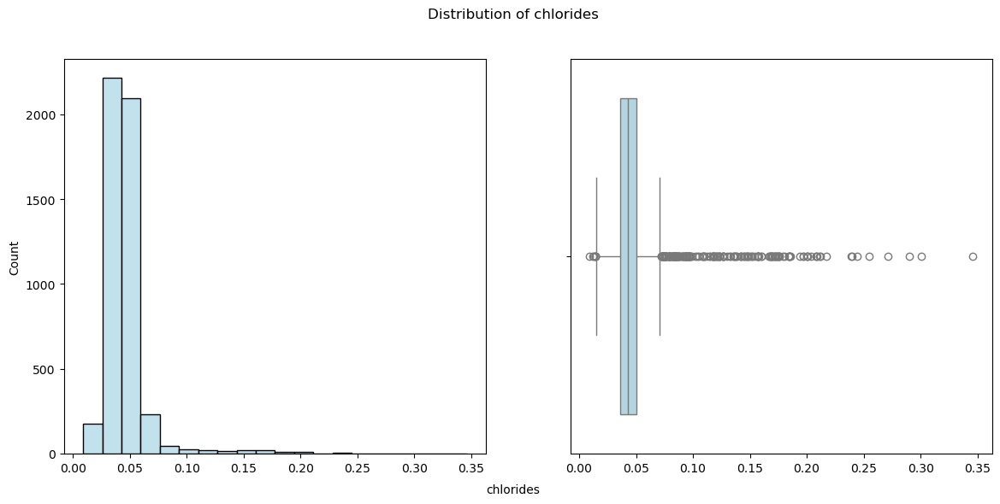

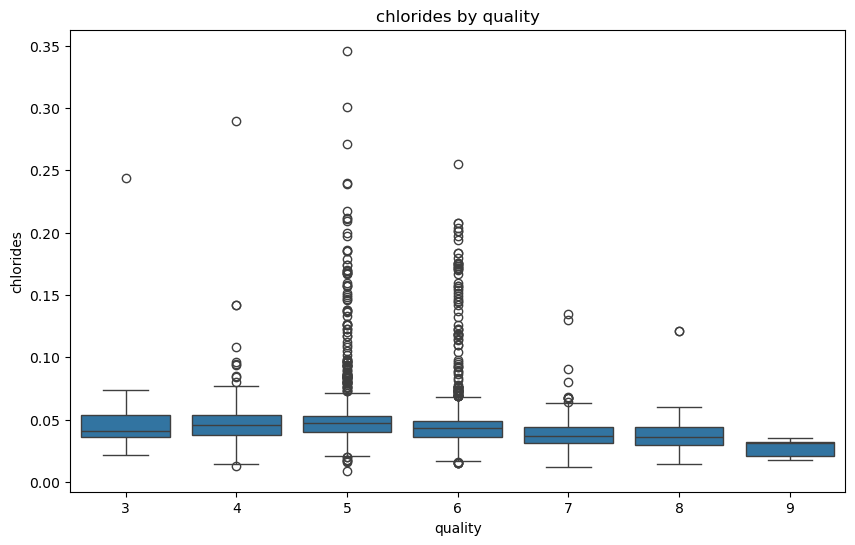

In [27]:
distribution('chlorides',20)
boxplot('chlorides')

#### chlorides is right skewed with the majority of data values in the 0.02 to 0.05 range

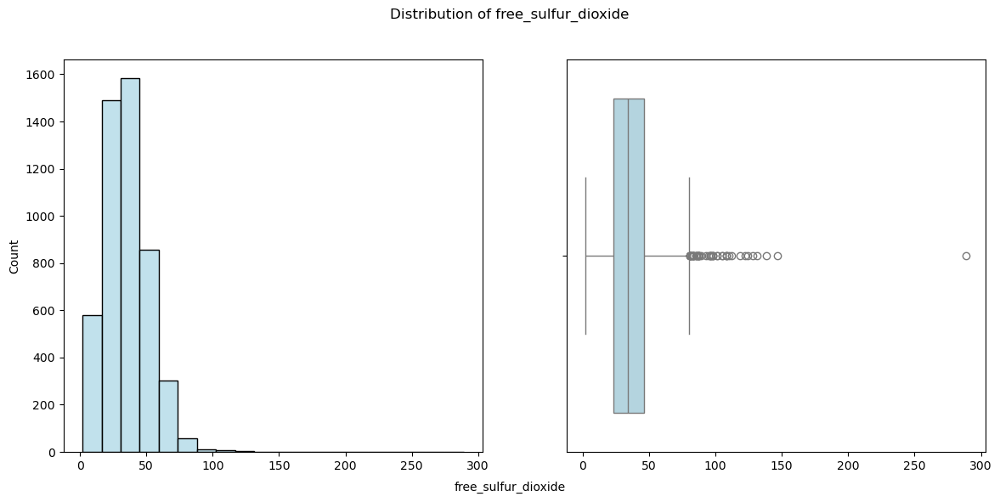

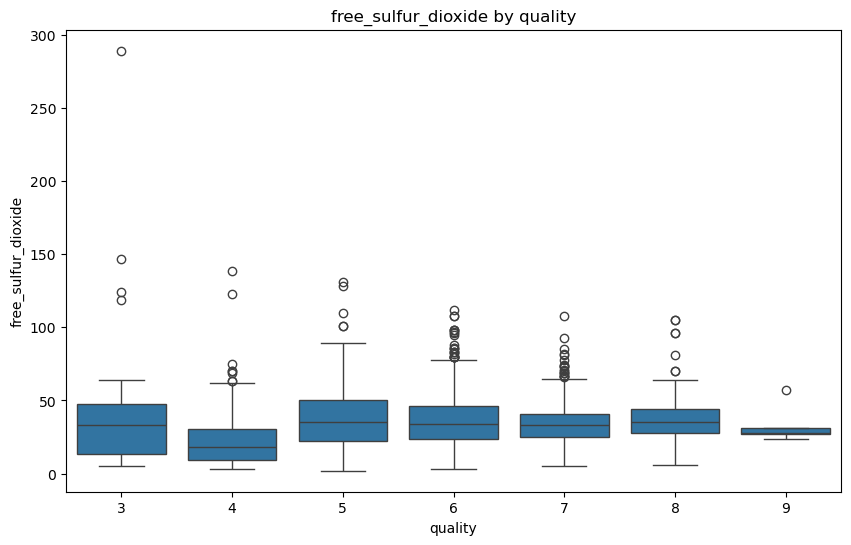

In [29]:
distribution('free_sulfur_dioxide',20)
boxplot('free_sulfur_dioxide')

#### free_sulfur_dioxide is right skewed

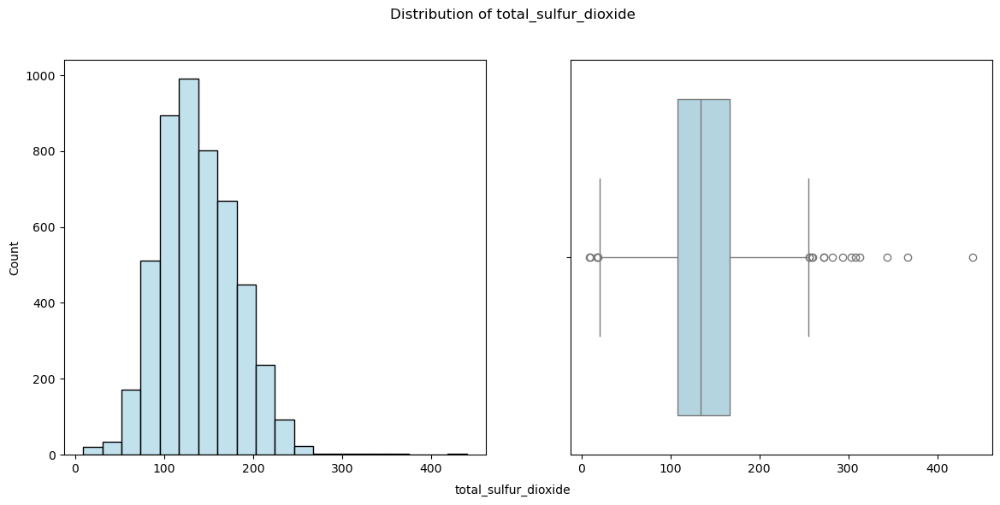

In [31]:
distribution('total_sulfur_dioxide',20)

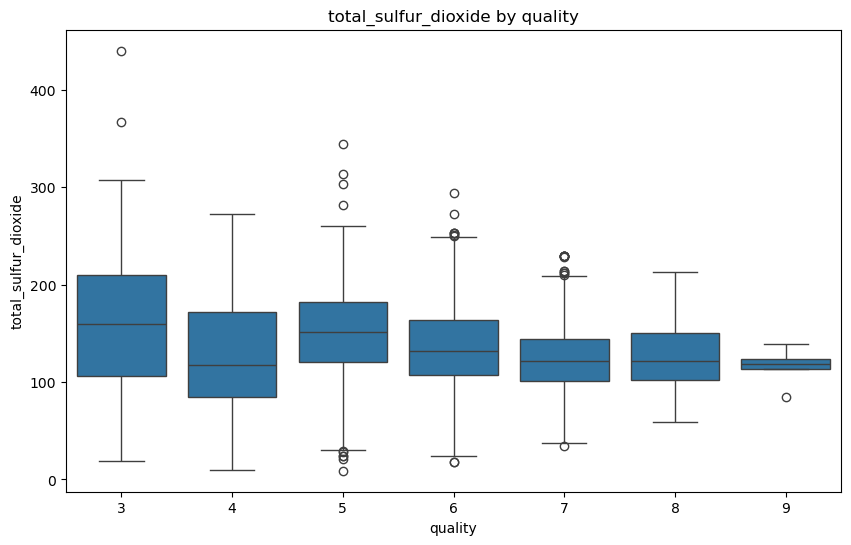

In [32]:
boxplot('total_sulfur_dioxide')

#### total_sulfur_dioxide is mostly unimodal with slight right skew

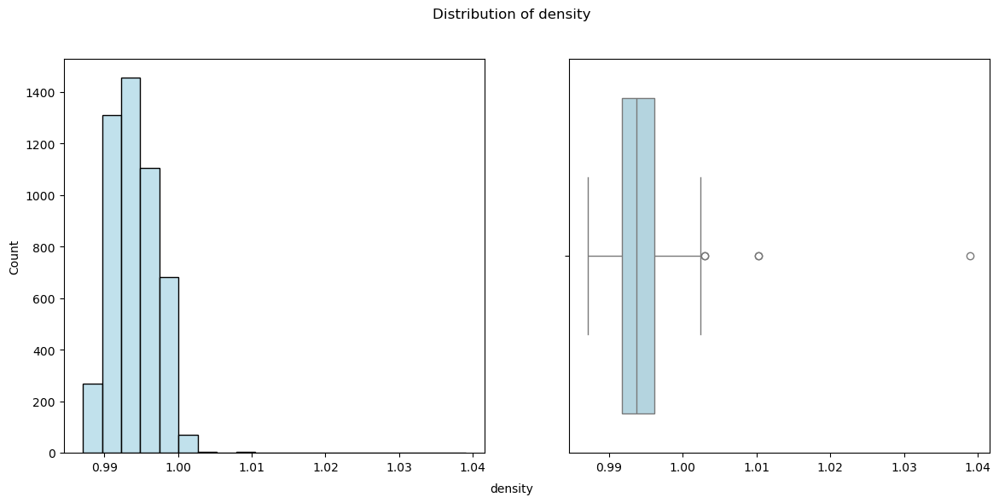

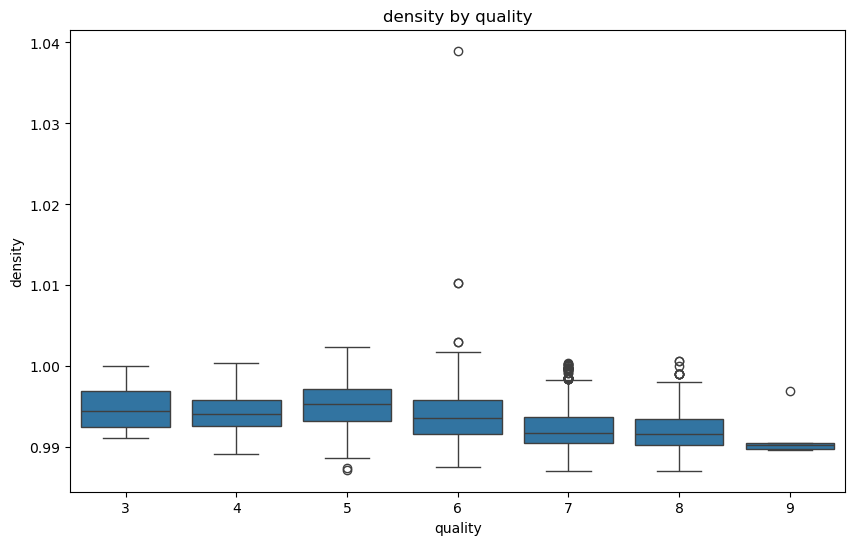

In [34]:
distribution('density',20)
boxplot('density')

#### density is right skewed with the majority of data points in the 0.99 to 1 range

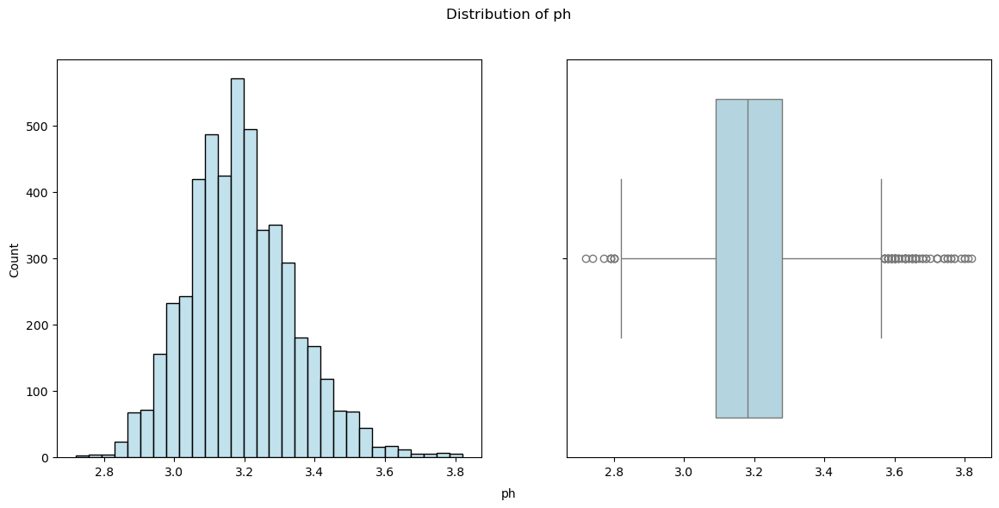

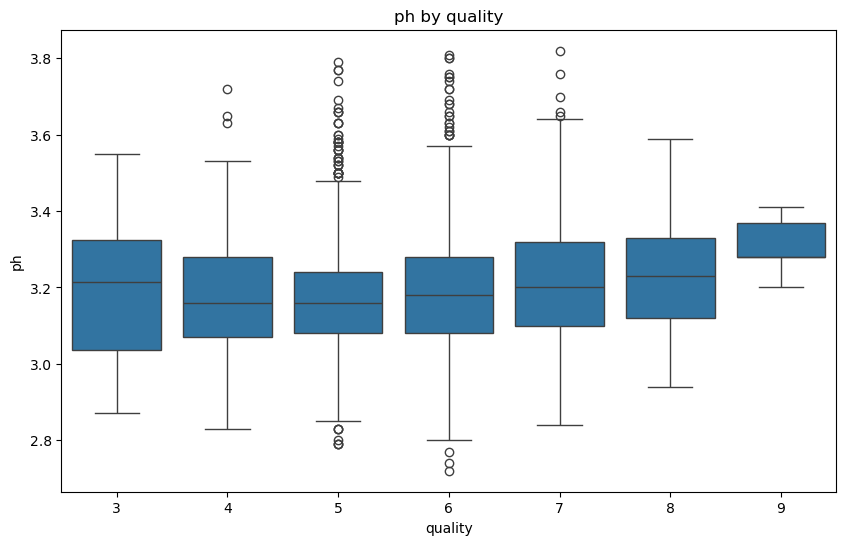

In [36]:
distribution('ph',30)
boxplot('ph')

#### ph is mostly normally distributed, with a slight right skew

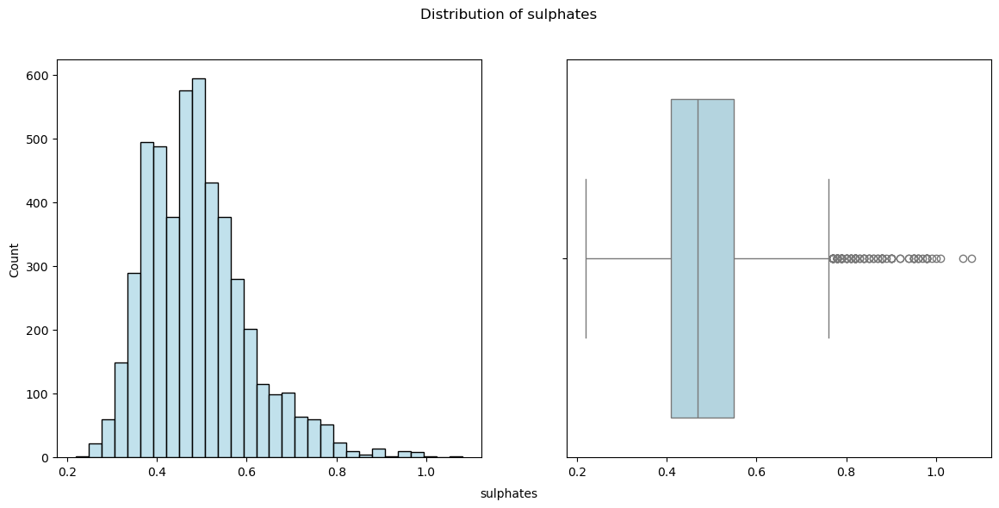

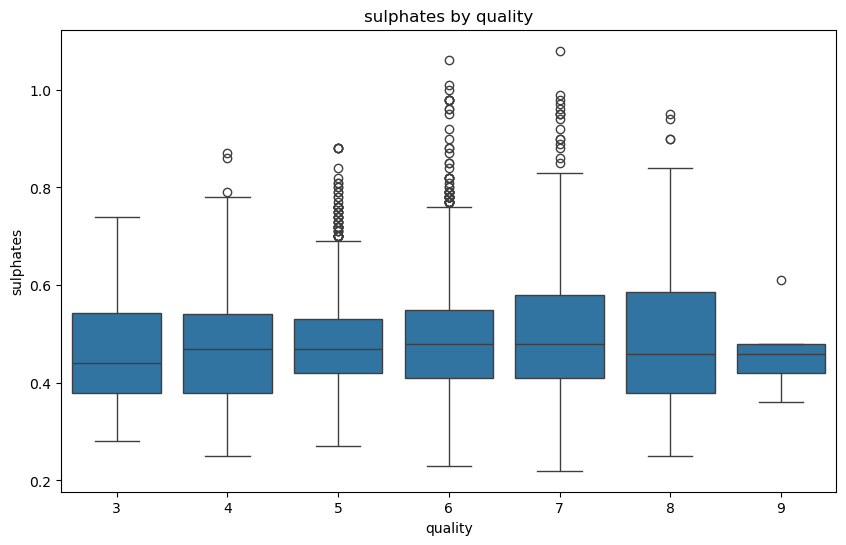

In [38]:
distribution('sulphates',30)
boxplot('sulphates')

#### sulphates is somewhat unimodal with a right skew

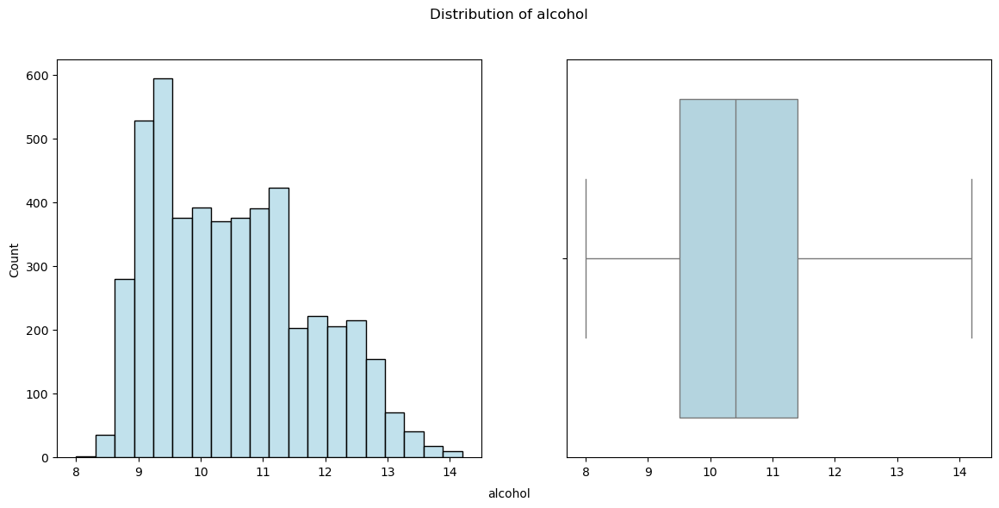

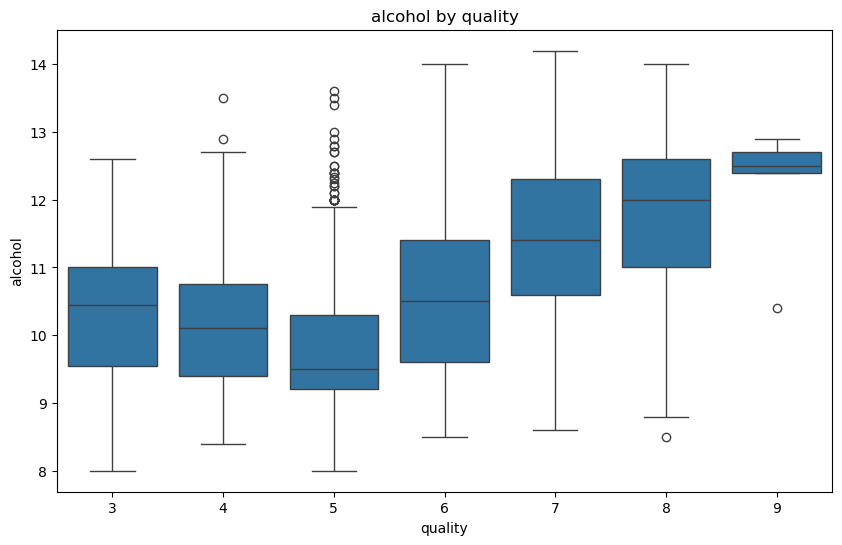

In [40]:
distribution('alcohol',20)
boxplot('alcohol')

#### alcohol is right skewed 

#### Scatter Plots

In [43]:
# function for scatter plot by quality
def scatter(x,y,tar):
    if tar=='quality':
        palette={
            1: '#ff0000',  # Red
            2: '#ff7f00',  # Orange
            3: '#ffff00',  # Yellow
            4: '#7fff00',  # Chartreuse Green
            5: '#00ff00',  # Green
            6: '#00ffff',  # Cyan
            7: '#007fff',  # Azure
            8: '#0000ff',  # Blue
            9: '#7f00ff',  # Violet
            10: '#ff00ff'  # Magenta
        }
        
    plt.figure(figsize=(10,6))
    sns.scatterplot(data=white_wine_df,x=x,y=y,hue=tar,palette=palette,alpha=0.4)
    plt.title(f'{x} vs. {y} by {tar}')
    plt.show()

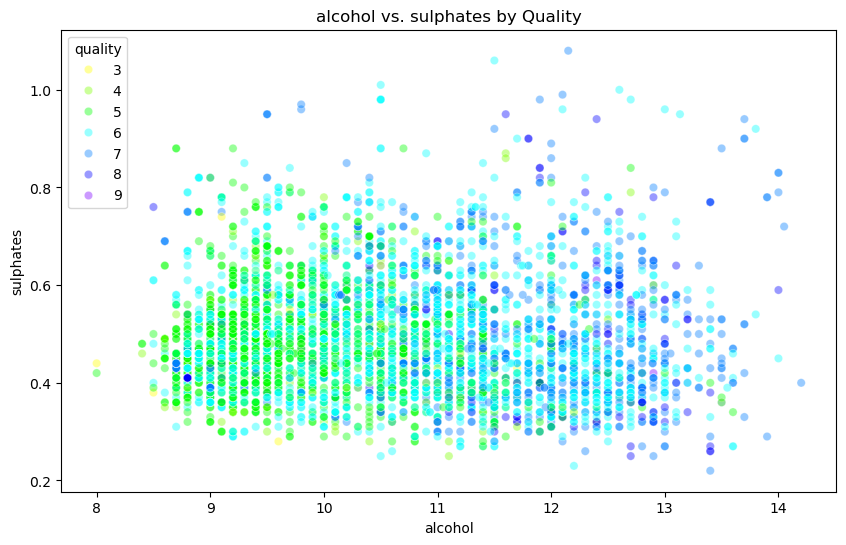

In [87]:
scatter('alcohol','sulphates')

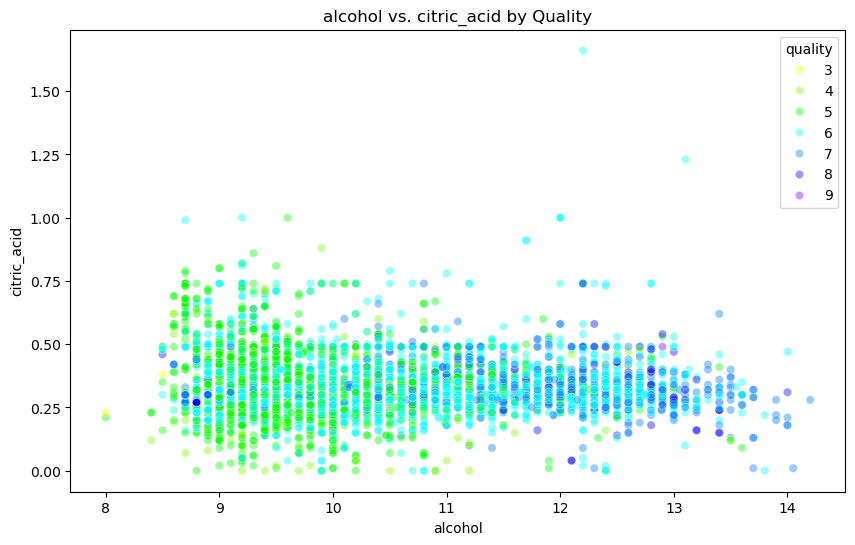

In [89]:
scatter('alcohol','citric_acid')

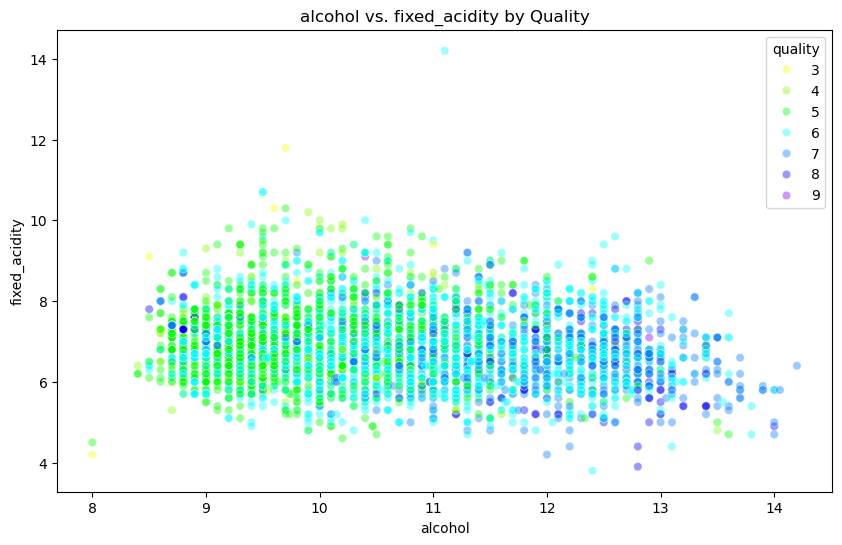

In [91]:
scatter('alcohol','fixed_acidity')

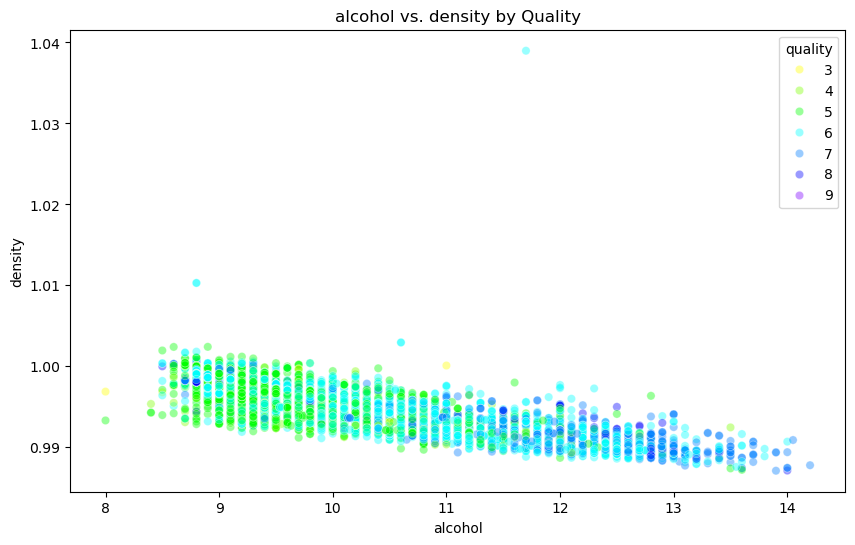

In [93]:
scatter('alcohol','density')

In [95]:
# functino for transformed quality
def scatter_transform(x,y):
    plt.figure(figsize=(10,6))
    sns.scatterplot(data=white_wine_df,x=x,y=y,hue='quality_transformed',alpha=0.4)
    plt.title(f'{x} vs. {y} by Quality')
    plt.show()

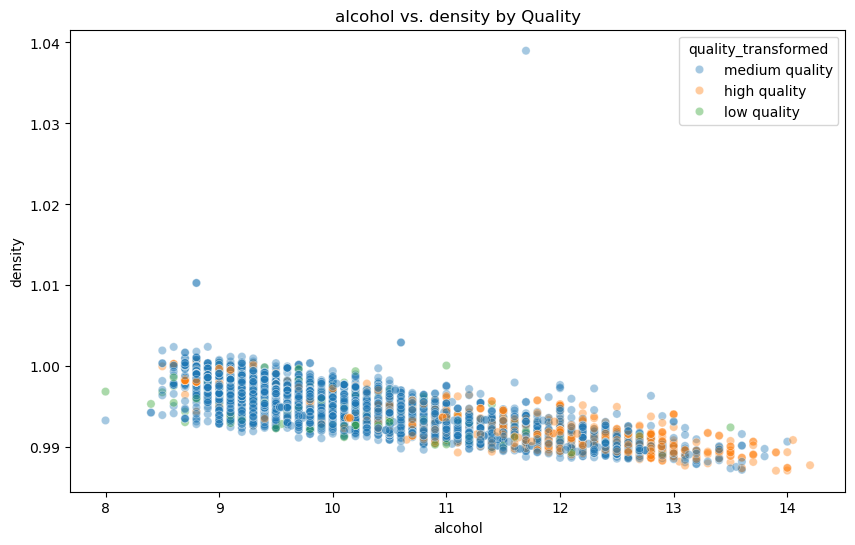

In [97]:
scatter_transform('alcohol','density')

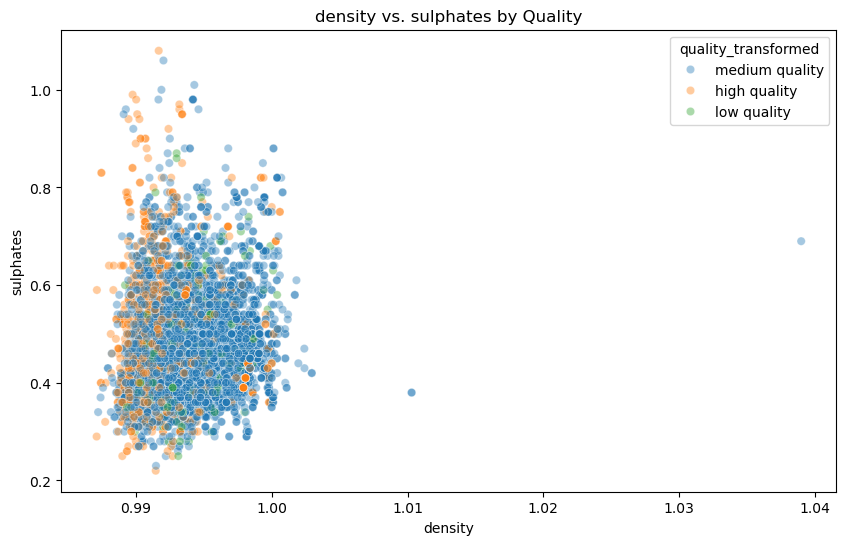

In [99]:
scatter_transform('density','sulphates')

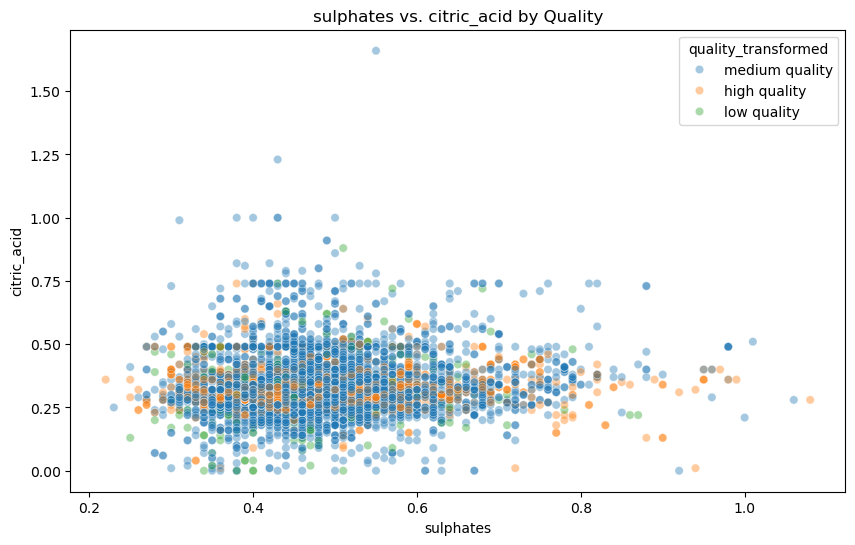

In [101]:
scatter_transform('sulphates','citric_acid')

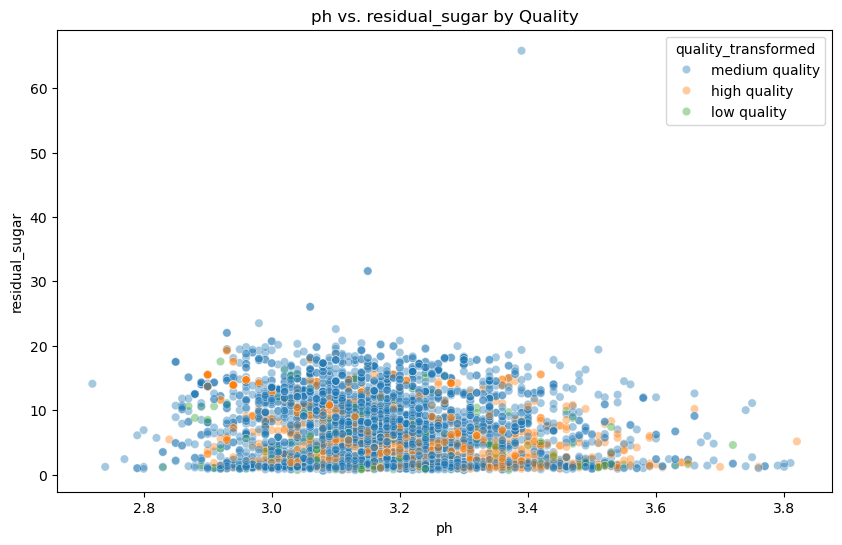

In [107]:
scatter_transform('ph','residual_sugar')

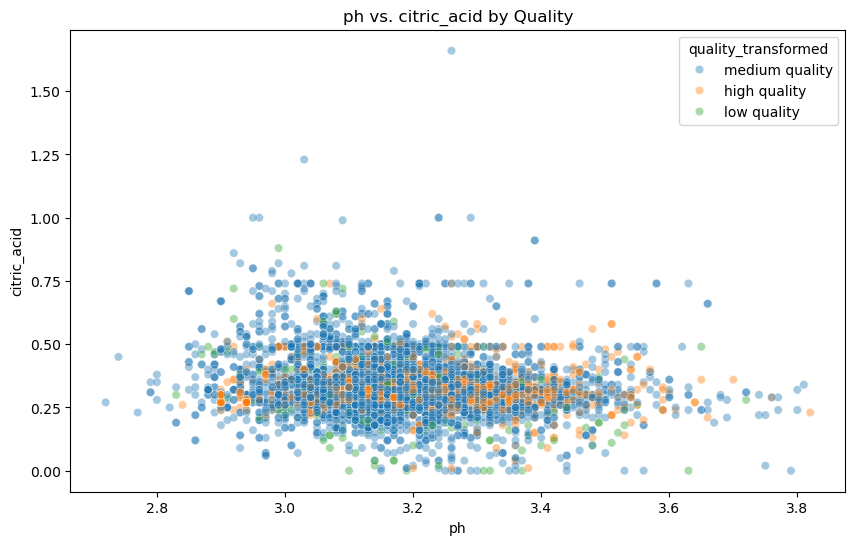

In [109]:
scatter_transform('ph','citric_acid')

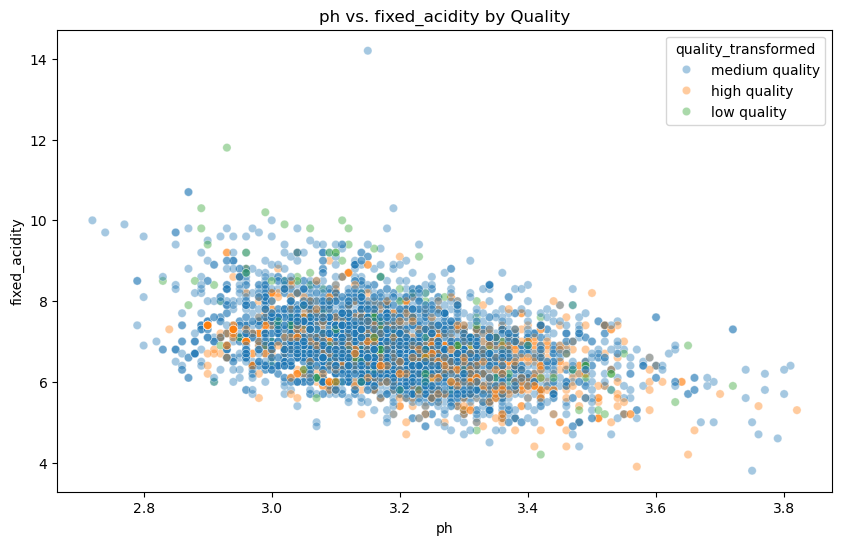

In [111]:
scatter_transform('ph','fixed_acidity')

In [115]:
def scatter_transform_2(x,y):
    plt.figure(figsize=(10,6))
    sns.scatterplot(data=white_wine_df,x=x,y=y,hue='quality_transformed',alpha=0.4)
    plt.title(f'{x} vs. {y} by Quality')
    plt.show()

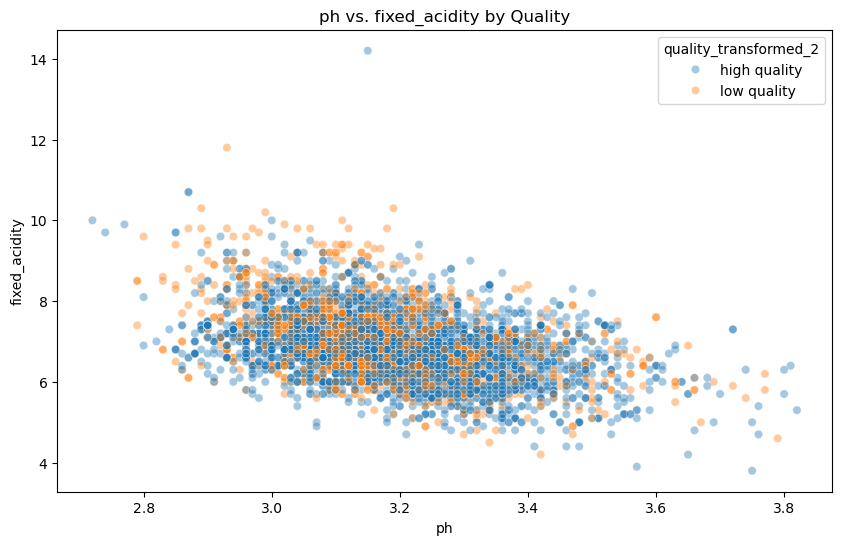

In [119]:
scatter_transform_2('ph','fixed_acidity')

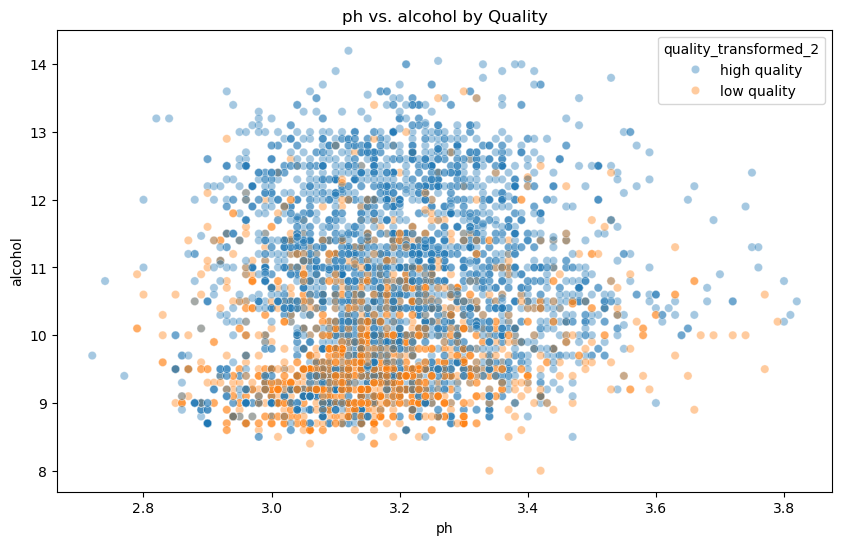

In [121]:
scatter_transform_2('ph','alcohol')

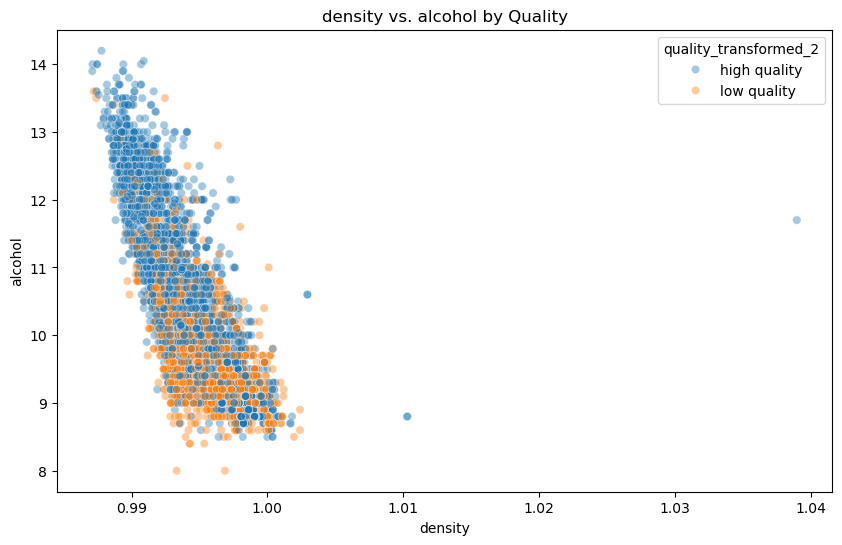

In [123]:
scatter_transform_2('density','alcohol')

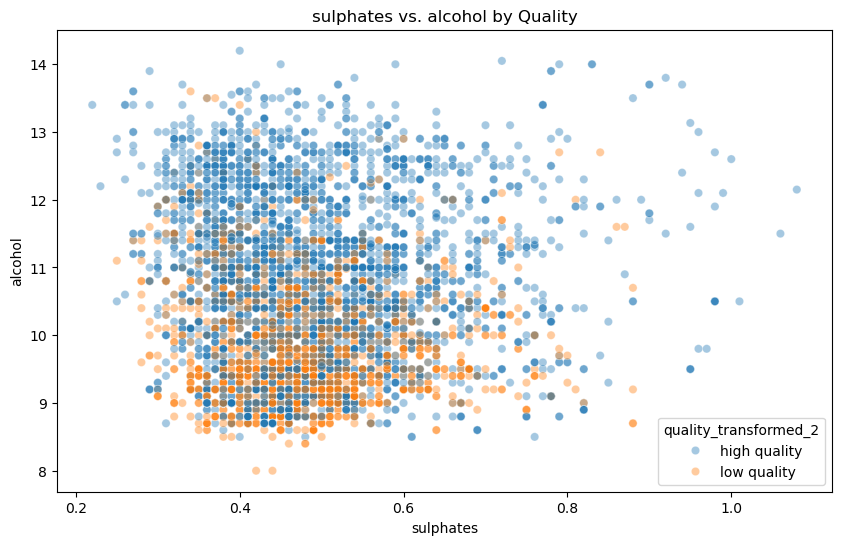

In [125]:
scatter_transform_2('sulphates','alcohol')

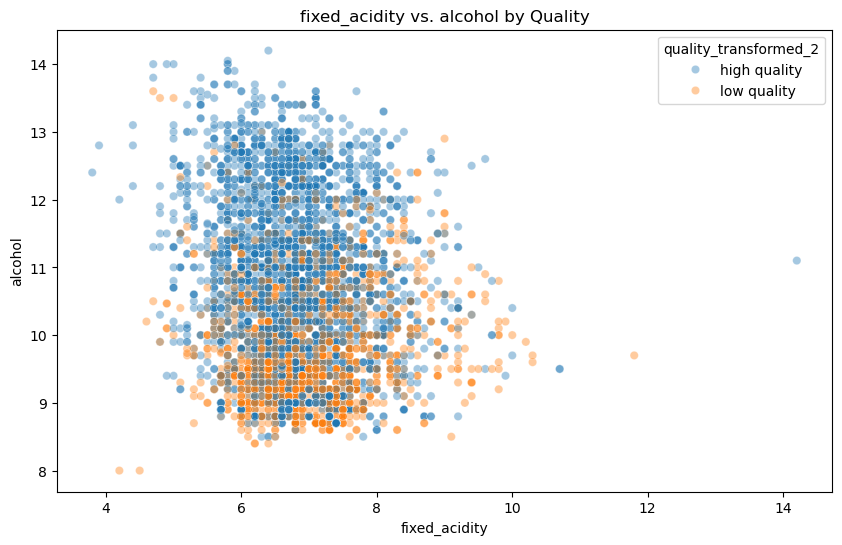

In [127]:
scatter_transform_2('fixed_acidity','alcohol')

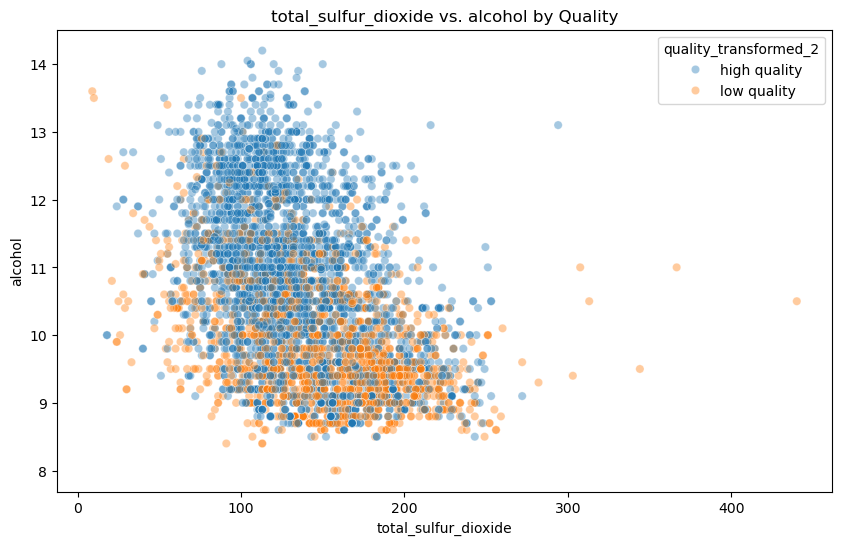

In [129]:
scatter_transform_2('total_sulfur_dioxide','alcohol')